# Make Figures for Mouse Data

This notebook is used to make figures using data from mice (M1, M2, M3, M4, M5, and integrated objects) for the blood/tumor project. For each sample, there are two tissues (blood and tumor), and for each tissue there is a count matrix and a TCR metadata file.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import matplotlib as mpl
from matplotlib.transforms import Bbox
from matplotlib import cm                                                   # To make custom heat maps
from matplotlib.colors import ListedColormap, LinearSegmentedColormap       # To make custom color maps
import anndata
import scanpy as sc
from matplotlib.ticker import ScalarFormatter,MultipleLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from collections import Counter
from openpyxl import load_workbook
import xlsxwriter
import palettable
import os.path
from palettable.cartocolors.sequential import PurpOr_7

# Set a seed
np.random.seed(2)

# Check to see if output directories exist

In [2]:
for folder in ['Figures', 'Outputs']:
    if not os.path.isdir(folder):
        os.mkdir(folder)

# Create Functions

### Create a Function to Save Subplots

In [3]:
# From https://stackoverflow.com/questions/4325733/save-a-subplot-in-matplotlib

def full_extent(ax, pad_x=0.0, pad_y=0.0):
    """Get the full extent of an axes, including axes labels, tick labels, and
    titles."""
    # For text objects, we need to draw the figure first, otherwise the extents
    # are undefined.
    ax.figure.canvas.draw()
    items = ax.get_xticklabels() + ax.get_yticklabels() 
    items += [ax, ax.title, ax.xaxis.label, ax.yaxis.label]
    bbox = Bbox.union([item.get_window_extent() for item in items])

    return bbox.expanded(1.0 + pad_x, 1.0 + pad_y)

### Create a Function to call only AB Clones

In [4]:
def AB_Clones(Adata, non_AB=False):
    """
    This function takes an Adata object and returns all the cells that have at least one alpha and
    one beta chain.
    
    The 'non_AB' option (Boolean) asks the user to specify if they want to return the non-AB cells as well.
    Default is False, meaning that only the AB cells will be returned.
    """
    
    # Adata object with AB clones
    Adata_AB = Adata[ ~ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Adata object with non-AB clones
    Adata_non_AB = Adata[ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Remove the unused categories
    Adata_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    Adata_non_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    
    # If user asks to return the non-AB clones, return both
    if non_AB:
        return Adata_AB, Adata_non_AB
    
    # Otherwise, return just the AB clones
    else:
        return Adata_AB

### Create a Function to Initialize the Number of Plots

In [5]:
def MakeFigAxes(ncols, n_axes, figsize=(10,8), constrained_layout = False):
    
    # Determine how many rows are needed
    if n_axes%ncols == 0:
        nrows = int(n_axes/ncols)
    else:
        nrows = int(1+ int(n_axes/ncols))
    
    # Special case if only using one row
    if nrows == 1:
        fig, axes = plt.subplots(nrows = nrows, ncols = n_axes, figsize = figsize,
                                 constrained_layout = constrained_layout)
        axes = np.array(axes)
        axes.shape = (n_axes,)
    
    # For more than 1 row
    else:
        fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize,
                                 constrained_layout = constrained_layout)
    
        # Delete unnecessary axes
        if n_axes != nrows*ncols:
            n_axes_to_delete = (nrows*ncols - n_axes)
            for i in range(1,n_axes_to_delete+1):
                ax = axes.flatten()[-i]
                fig.delaxes(ax)
                
    return fig, axes

### Create a Function to Find Intersection of Genes

In [6]:
def IntersectionOfGenes(object1, object2, sort = False, upper = False):
    """
    This function returns the genes in the intersection of two objects. If the object is an Adata object,
    then the gene names are used (Adata.var_names). Otherwise, the function expects a set or a list of genes.
    
    This code is NOT optimized for speed - rather, the goal is to return the intersection of genes:
    - in the order of the first list
    - regardless of whether or not either list is upper or lower case
    
    Inputs
    ------
    object1: An Adata object, a list of genes, or a set of genes.
    object2: An Adata object, a list of genes, or a set of genes.
    sort (Bool): Sorts the final output. Default is False (genes will be return in the order of object1)
    upper (Bool): Upper-cases the final output. Default is False (genes will be returned in the original case)
    """
    
    ### Parse the inputs and see if they're lists or Adata objects ###
    
    import anndata
    
    # Initialize an empty object to store the lists
    Lists = [0, 0]
    
    # Loop over each input object
    for i,obj in enumerate([object1, object2]):
        
        # If the object is an Adata object, extract the genes as a list
        if type(obj) == anndata._core.anndata.AnnData:
            Lists[i] = list(obj.var_names)
        
        else:
            # Otherwise,  object is assumed to be a list or set - therefore, turn it into a list.
            Lists[i] = list(obj)
            
            
    # Now we have two gene lists
    list1 = Lists[0]
    list2 = Lists[1]
    
    ### Find the intersection of both lists ###
    
    # Initialize a list of False values
    TrueFalse = [False] * len(list1)
    
    # Make both genes upper case to find the intersection
    List1 = list(map(str.upper, list1))
    List2 = list(map(str.upper, list2))
    
    # For each gene in the first list, if it exists in the second list,
    # then set its truth value to True
    for i,gene in enumerate(List1):
        if gene in List2:
            TrueFalse[i] = True
            
    # Create an object to be returned by doing the following:
    ListToReturn = np.array(list1)             # Turn the original list into a NumPy array
    ListToReturn = ListToReturn[TrueFalse]     # Keep only the genes that are in the intersection
    ListToReturn = list(ListToReturn)          # Return it to a list to to use list methods
          
    # Sort the genes, if specified
    if sort == True:
        ListToReturn.sort()
        
    # Upper case all the genes, if specified
    if upper == True:
        ListToReturn = list(map(str.upper, ListToReturn))
    
    # Return the list
    return ListToReturn

# Load sample names

In [7]:
samples = ['M1', 'M2', 'M3', 'M4', 'M5']

# Load Adata Objects (individual samples)

In [8]:
# Initialize empty objects
Blood_adatas = [0] * len(samples)
Tumor_adatas = [0] * len(samples)

# Path where adata objects are located
adata_path = 'Path/to/ScanpyObjects/'

# Loop over each sample
for i,sample in enumerate(samples):
    
    print(sample)
    
    Blood_adatas[i] = anndata.read_h5ad(adata_path + sample + '_Blood.h5ad')
    Tumor_adatas[i] = anndata.read_h5ad(adata_path + sample + '_Tumor.h5ad')
    
    print("{} cells in {}_Blood".format(len(Blood_adatas[i]), sample))
    print("{} cells in {}_Tumor\n".format(len(Tumor_adatas[i]), sample))

M1
3124 cells in M1_Blood
3135 cells in M1_Tumor

M2
3647 cells in M2_Blood
3167 cells in M2_Tumor

M3
3509 cells in M3_Blood
2148 cells in M3_Tumor

M4
3416 cells in M4_Blood
2810 cells in M4_Tumor

M5
3624 cells in M5_Blood
3999 cells in M5_Tumor



# Load Integrated Adata Objects

In [9]:
# Path where adata objects are located
adata_path = '/Users/oshahid/Desktop/BloodTumorData/Scanpyobjects/'

MouseIntBlood = anndata.read_h5ad(adata_path + 'MouseIntegratedBlood.h5ad')
MouseIntTumor = anndata.read_h5ad(adata_path + 'MouseIntegratedTumor.h5ad')

print(len(MouseIntBlood))
print(len(MouseIntTumor))

10280
8450


# Load Gene Lists

In [10]:
# Text files
with open('GeneLists/cd8_activation_sarkar_up.txt', 'r') as f:
    sarkar_activation = f.read().splitlines() 
    
with open('GeneLists/cell_cycle_all_strong.txt', 'r') as f:
    cellcycle = f.read().splitlines() 
    
with open('GeneLists/KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_UP.txt', 'r') as f:
    kaech_naive = f.read().splitlines()

In [11]:
# Excel Files
def ReadGeneSig(Excel_File, sheet_name):
    """
    Function to load gene lists from Excel files.
    """
    genes = pd.read_excel(Excel_File, sheet_name = sheet_name, index_col = 0, header = None)
    genes = list(genes.index.str.upper())
    return genes


effector_like = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Effector-like")
terminallyexh = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Terminally Exh.")
proliferating = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Proliferating")
progenitorexh = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Progenitor Exh.")
bystander = ReadGeneSig("GeneLists/20200718_Mognol_PNAS2017_bystanders.xlsx", "P14 UP (bystander)")
TRM = ReadGeneSig("GeneLists/20200711_Beura_Trm_2017_Immunity.xlsx", "Beura_FRT_TRM_UP")

# Plot UMAPs and Genes

### Create a Function for Plotting Seurat Clusters on UMAPs

In [13]:
def PlotUMAPs(Adata, title):
    
    df = Adata.obs.copy()
    
    # Make a list of colors for the scatterplot
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    Colors2 = ['red','black','blue','green','orange','yellow','brown','magenta','pink','gray',
               'purple','tan','lightblue','lightgreen']

    Colors.extend(Colors2)
    
    # Maximum number of clusters
    seurat_list = list(df['Seurat_clusters'])
    max_cluster = len(list(np.unique(seurat_list)))
    
    # Make an empty list, each element will be a dataframe separated by cluster
    clusters = [0] * (max_cluster+1)
    
    # Make a list of colors that correspond to each seurat cluster
    c = []

    for cluster_number in list(df['Seurat_clusters']):
        c.append(Colors[cluster_number])


    # Plot the clusters  
    fig, ax = plt.subplots(figsize=(10,8))
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Seurat_clusters', palette=Colors[0:max_cluster],
                   legend = 'full', ax=ax, s = 10, linewidth=0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    
    new_labels = ['Cluster ' + str(i) for i in np.unique(df['Seurat_clusters'])]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    ax.set_title(title + " ({} cells)".format(len(df)))
        
    plt.show()
    
    return fig,ax

### Plot Seurat Clusters on UMAPs (Individual Samples)

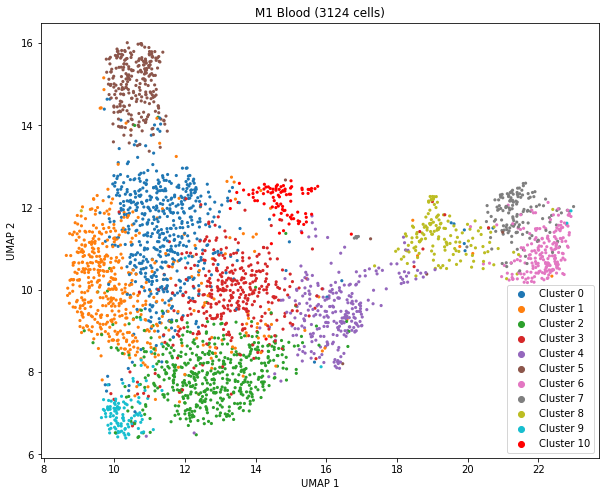

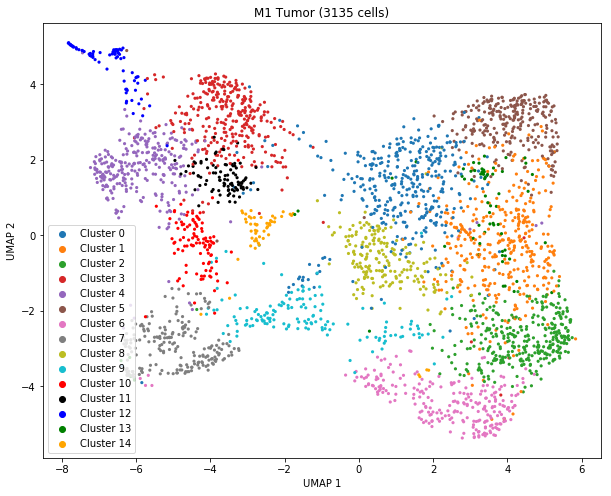

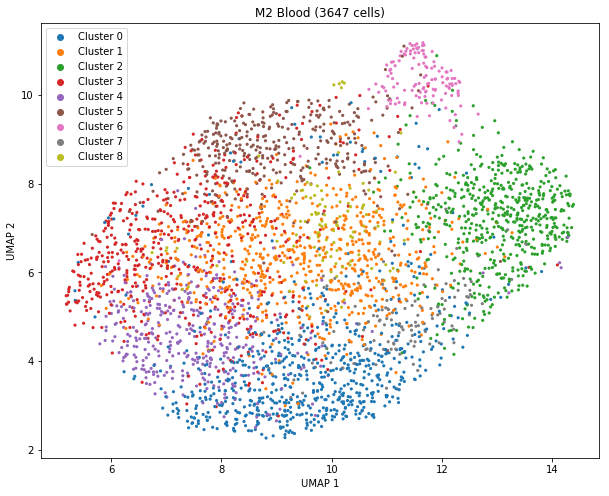

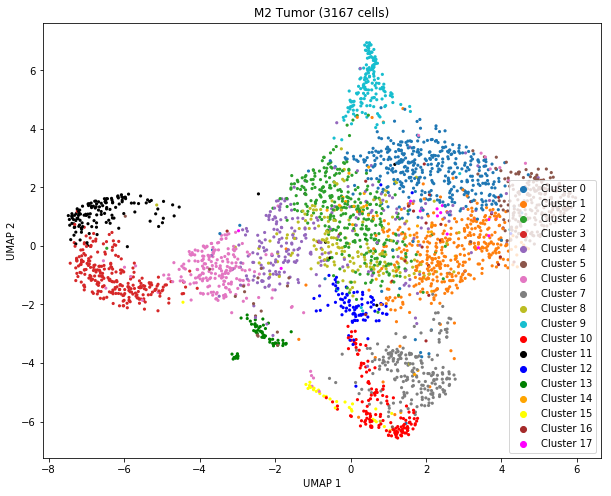

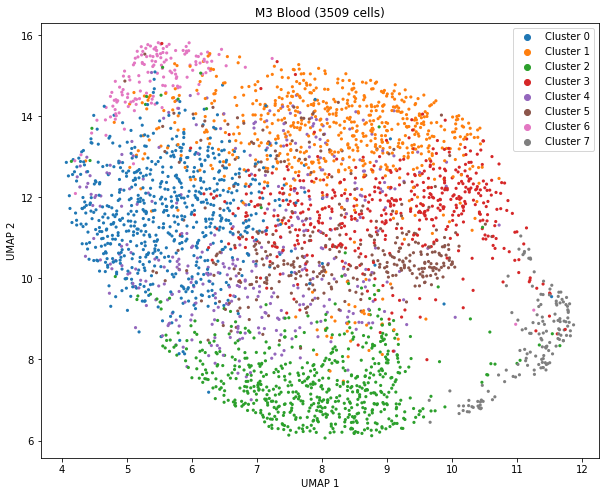

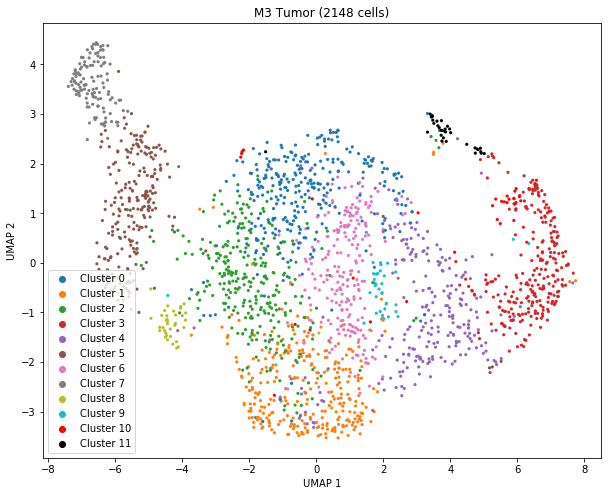

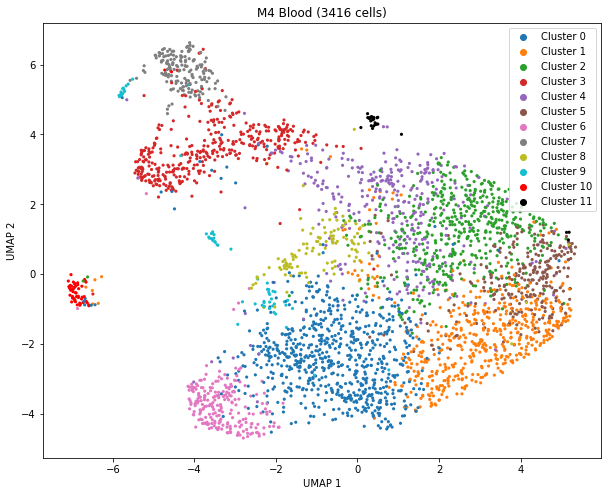

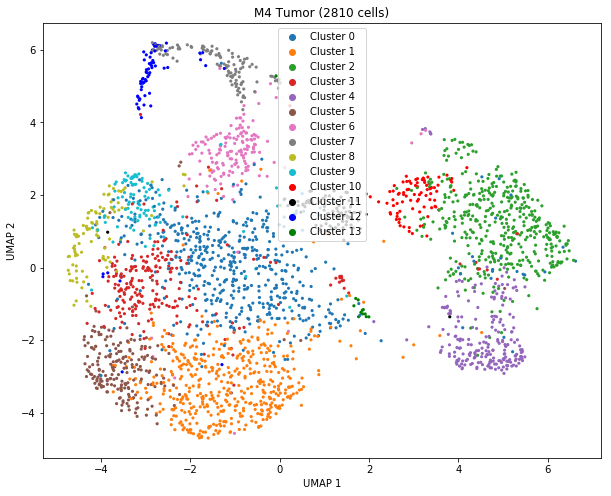

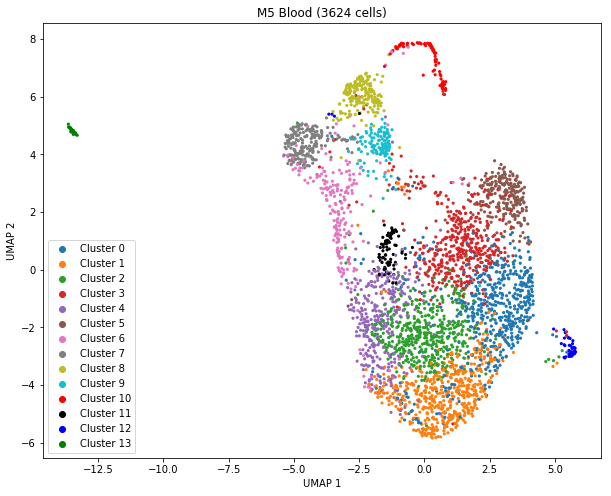

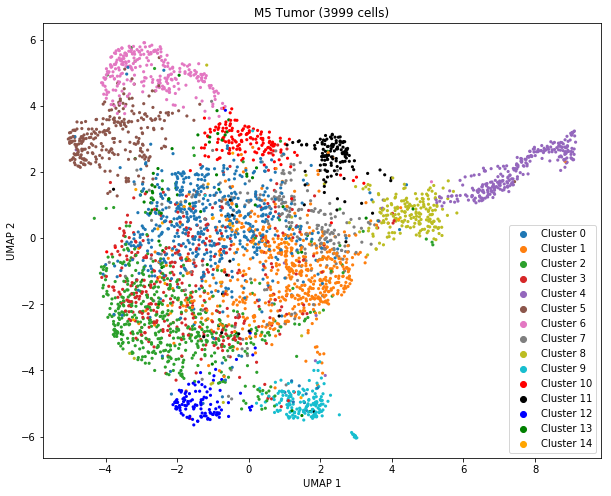

In [14]:
for i,sample in enumerate(samples):

    PlotUMAPs(Blood_adatas[i], "{} Blood".format(sample))
    PlotUMAPs(Tumor_adatas[i], "{} Tumor".format(sample))

### Plot Seurat Clusters on UMAPs (Integrated Samples)

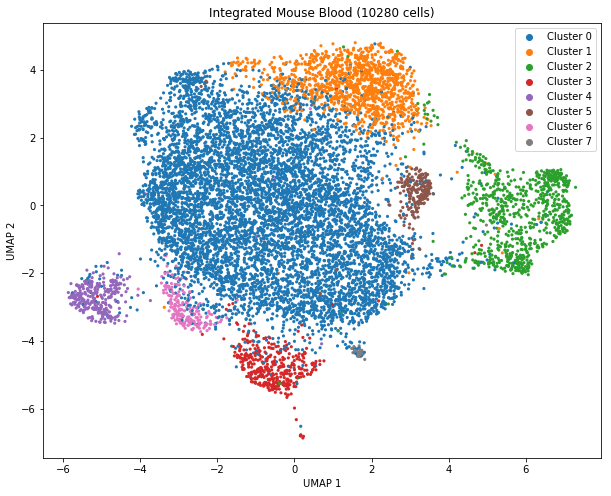

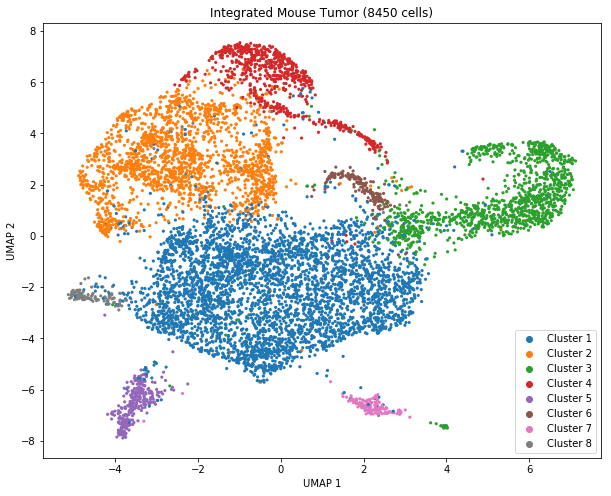

(<Figure size 720x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fae7c9560d0>)

In [15]:
PlotUMAPs(MouseIntBlood, "Integrated Mouse Blood")
PlotUMAPs(MouseIntTumor, "Integrated Mouse Tumor")

### Plot Specific Genes on UMAPs (Individual Samples)

In [16]:
# Default folder to save figures in
sc.settings.figdir = 'Figures/'

# File format
sc.settings.file_format_figs = "pdf"

M1_Blood


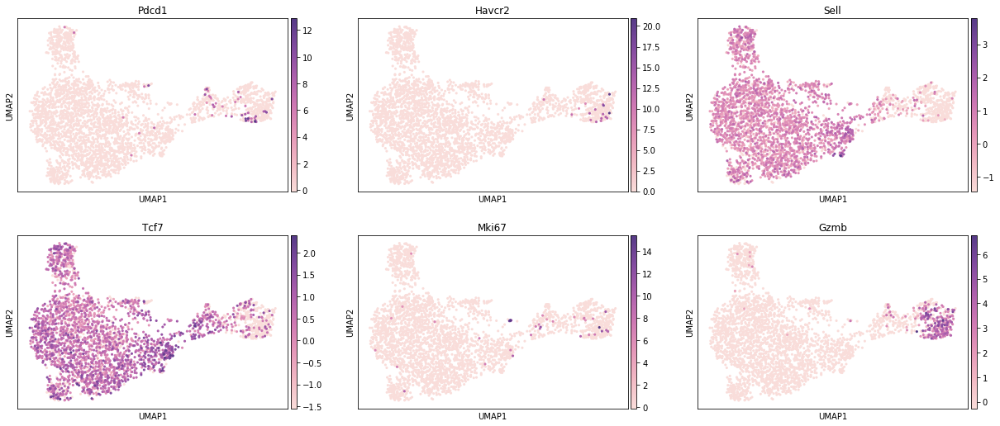

M2_Blood


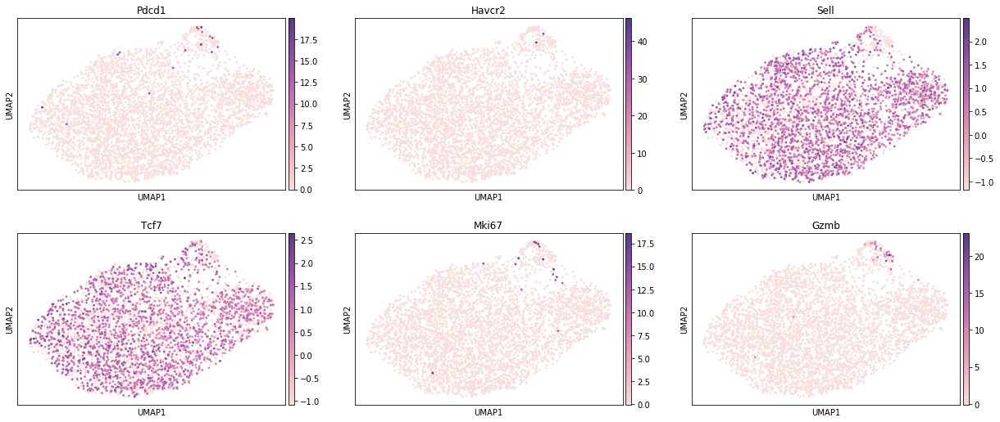

M3_Blood


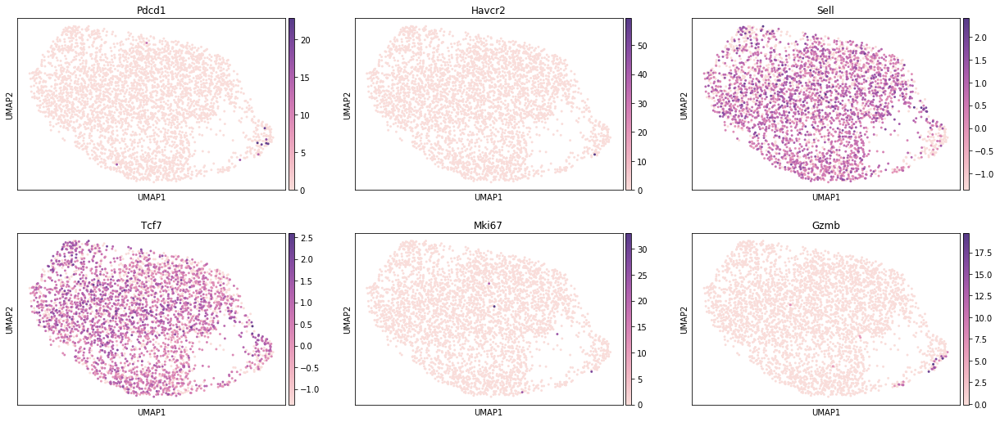

M4_Blood


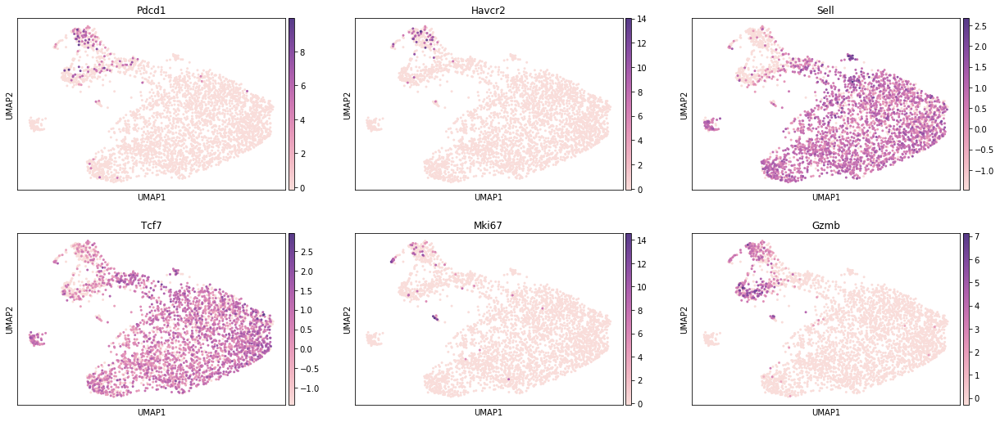

M5_Blood


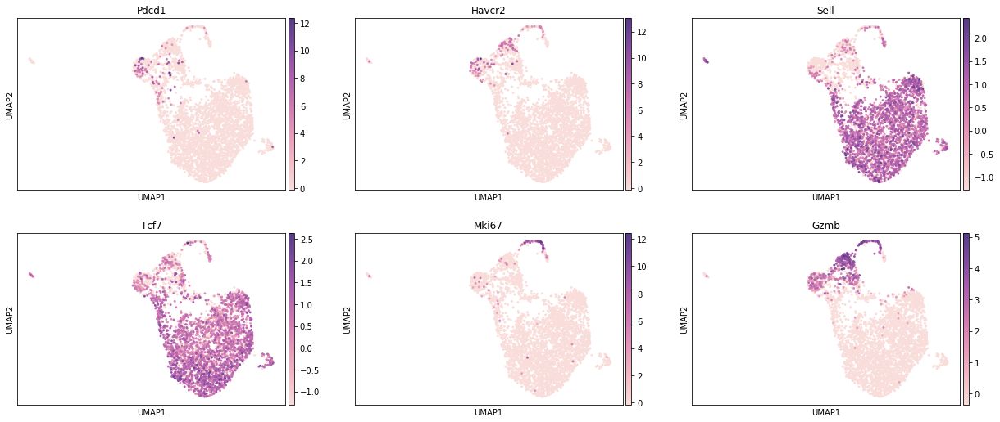

In [17]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

for i,sample in enumerate(samples):
    
    print(sample + '_Blood')
    
    Adata = Blood_adatas[i].copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    
    # Filter genes to keep only the ones found in each sample
    genes_to_plot = IntersectionOfGenes(genes, Adata)
    
    sc.pl.umap(Adata, color = genes_to_plot, ncols = 3, color_map = PurpOr_7.mpl_colormap)

M1_Tumor


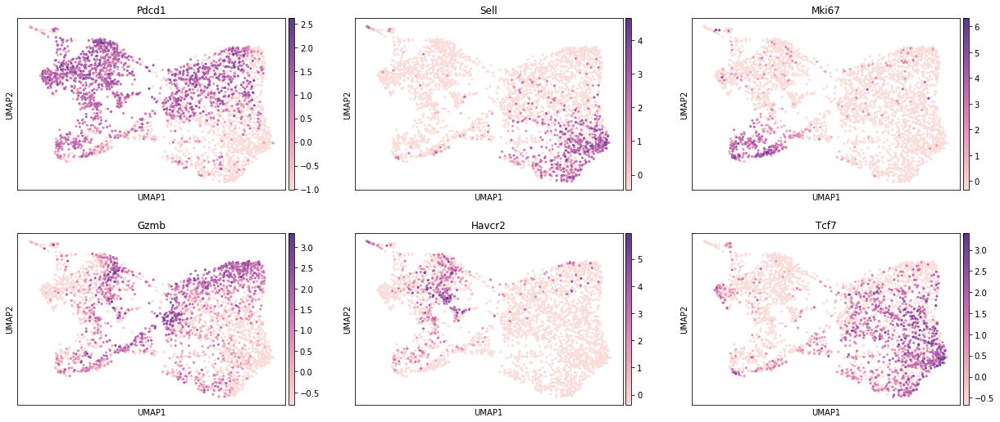

M2_Tumor


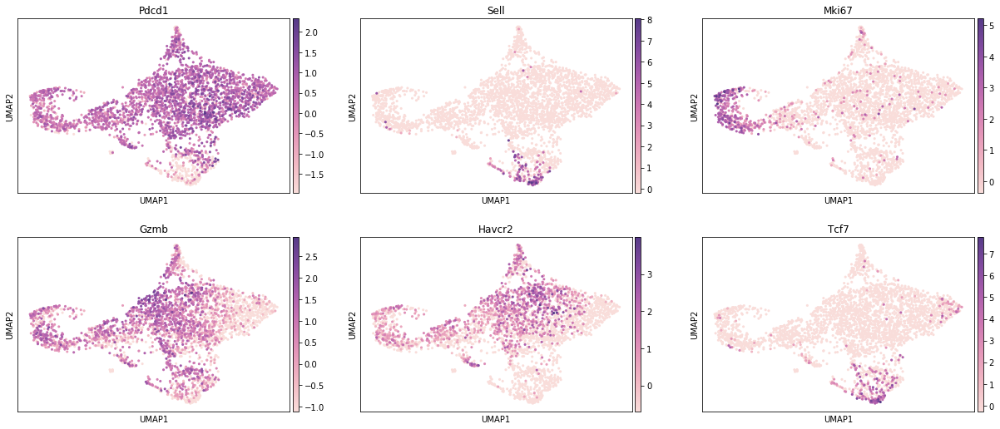

M3_Tumor


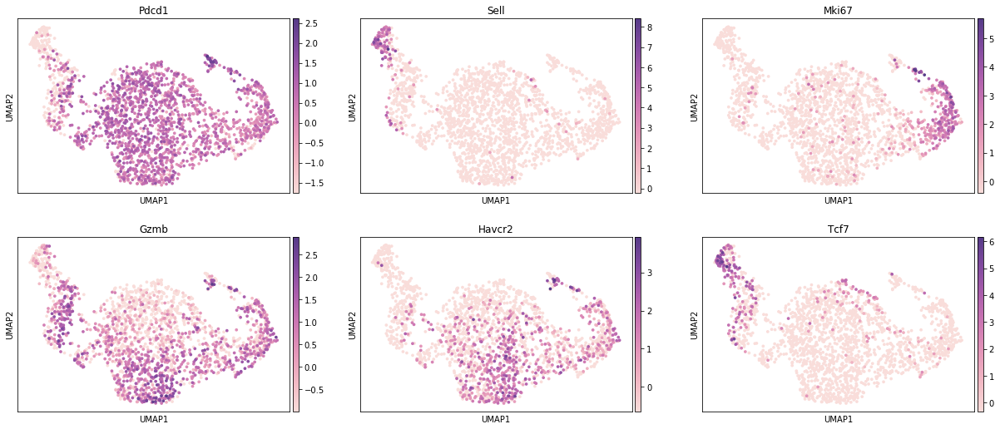

M4_Tumor


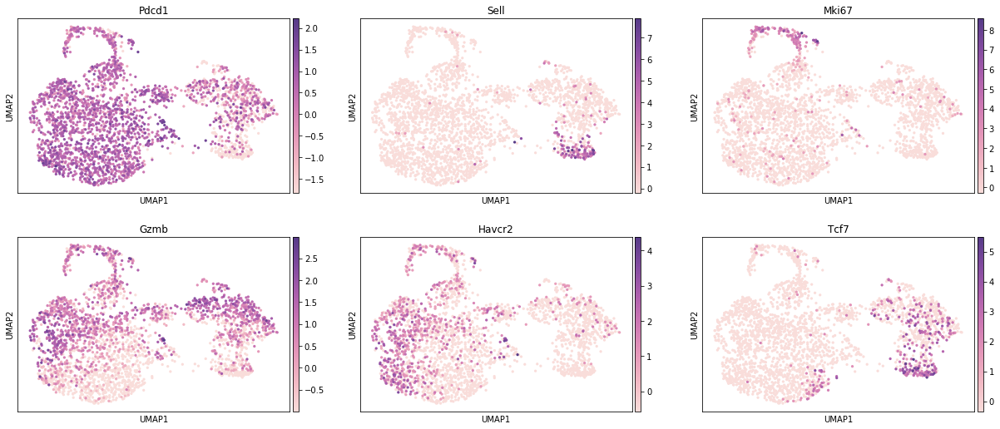

M5_Tumor


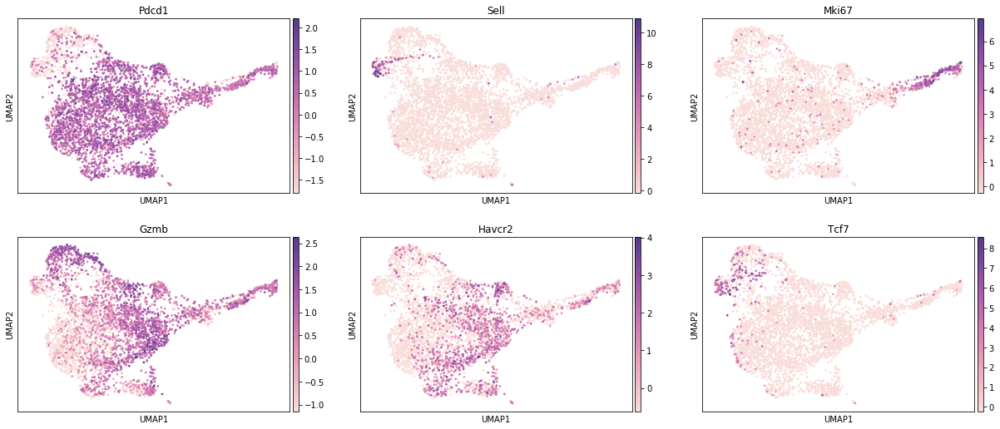

In [18]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

for i,sample in enumerate(samples):
    
    print(sample + '_Tumor')
    
    Adata = Tumor_adatas[i].copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    
    # Filter genes to keep only the ones found in each sample
    genes_to_plot = IntersectionOfGenes(Adata, genes)
    
    sc.pl.umap(Adata, color = genes_to_plot, ncols = 3, color_map = PurpOr_7.mpl_colormap)

### Plot Specific Genes on UMAPs (Integrated Samples)

Integrated Mouse Blood


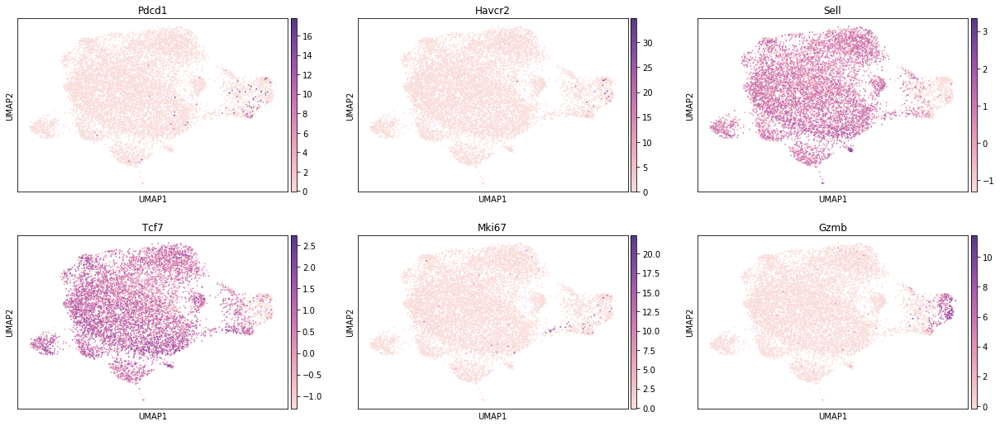

Integrated Mouse Tumor


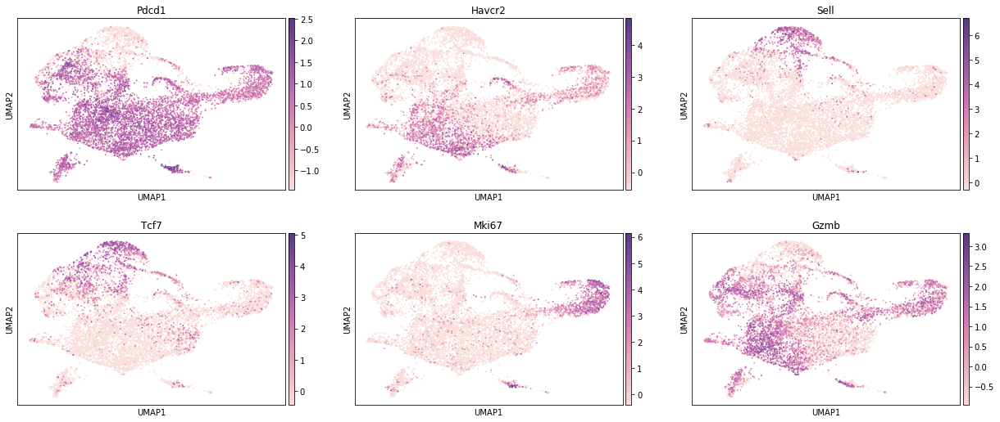

In [19]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

# Integrated samples
Integrated = [MouseIntBlood, MouseIntTumor]
IntNames = ['Integrated Mouse Blood', 'Integrated Mouse Tumor']

for i,sample in enumerate(Integrated):
    
    print(IntNames[i])
    
    Adata = sample.copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    
    # Filter genes to keep only the ones found in each sample
    genes_to_plot = IntersectionOfGenes(genes, Adata)
    
    # File names
    if i == 0:
        save_name = 'SuppFig1E_MouseIntBlood_markers.pdf'
    if i == 1:
        save_name = 'SuppFig1F_MouseIntTumor_markers.pdf'
    
    
    
    sc.pl.umap(Adata, color = genes_to_plot, ncols = 3, color_map = PurpOr_7.mpl_colormap, save = save_name)

# Expansion Plots

### Create function to make expansion plots

In [20]:
def ExpansionPlot(Adata, title, savename=None):
    
    df = Adata.obs.copy()
    
    LargestClone = max(df['Clone.size'])                   # Find the largest clone size

    purples = cm.get_cmap('Purples', LargestClone)         # Choose the colormap with 256 elements
    newcolors = purples(np.linspace(0, 1, LargestClone))   # Evenly spaced numbers between 0 and 1
    black = np.array([0/256, 0/256, 0/256, 1])             # Define the color black
    gray = np.array([192/256, 192/256, 192/256, 1])        # Define the color black
    newcolors[:1, :] = black                               # Clone sizes of 0 are colored black
    newcolors[1:2, :] = gray                               # Clone sizes of 1 are gray
    newcmp = ListedColormap(newcolors)                     # Combine these as a new colormap



    plt.figure(figsize=(10,8))                                          # Size of each figure
    plt.xlabel("UMAP 1")                                                # Label x-axis
    plt.ylabel("UMAP 2")                                                # Label y-axis

    # Scatterplot for all cells, colored by T cell expansion    
    plt.scatter(df['UMAP_1'], df['UMAP_2'], c = df['Clone.size'], s=2, cmap=plt.cm.get_cmap(newcmp),
               edgecolor = None)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(title + " ({} cells)\nBlack = Not a Clone, Gray = Clone Size of 1".format(len(df)))   # Add title
    plt.colorbar()

    plt.show()                                                          # Show the figure

### Make Expansion Plots

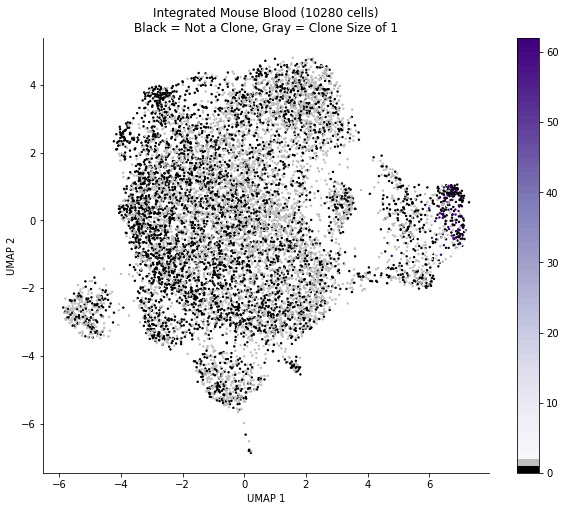

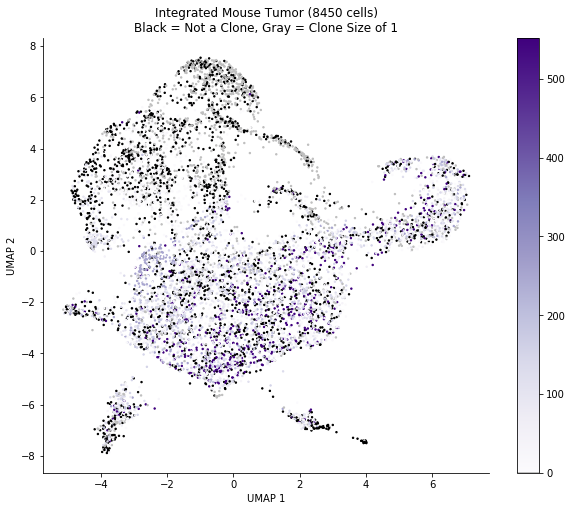

In [21]:
ExpansionPlot(MouseIntBlood, 'Integrated Mouse Blood')
ExpansionPlot(MouseIntTumor, 'Integrated Mouse Tumor')

### Create a function to make expansion plots (log10 transform)

In [22]:
def ExpansionPlotLog10(Adata, sample, save = False):
    
    df = AB_Clones(Adata).obs.copy()

    df['logClone_size'] = list(np.log10(df['Clone.size']))


    nClones = len(np.unique(df['logClone_size']))     # Find number of unique clones

    purples = cm.get_cmap('Purples', nClones)         # Choose the colormap with 256 elements
    newcolors = purples(np.linspace(0, 1, nClones))   # Evenly spaced numbers between 0 and 1
    gray = np.array([192/256, 192/256, 192/256, 1])        # Define the color black
    newcolors[:1, :] = gray                                # Clone sizes of 1 are gray
    newcmp = ListedColormap(newcolors)                     # Combine these as a new colormap



    plt.figure(figsize=(10,8))                                          # Size of each figure
    plt.xlabel("UMAP 1")                                                # Label x-axis
    plt.ylabel("UMAP 2")                                                # Label y-axis

    # Scatterplot for all cells, colored by T cell expansion    
    plt.scatter(df['UMAP_1'], df['UMAP_2'], c = df['logClone_size'], s=2, cmap=plt.cm.get_cmap(newcmp),
               edgecolor = None)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(sample + " ({} cells, log10 transform)\nGray = Clone Size of 1".format(len(df)))       # Add title
    plt.colorbar()
        
    if save is True:
        if sample == 'Integrated Mouse Blood':
            plt.savefig("Figures/Fig1G_MouseIntBlood_Expansion_log10.pdf")
            
        if sample == 'Integrated Mouse Tumor':
            plt.savefig("Figures/Fig3C_MouseIntTumor_Expansion_log10.pdf")

    plt.show()                                                          # Show the figure

### Make Expansion Plots (log10 transform)

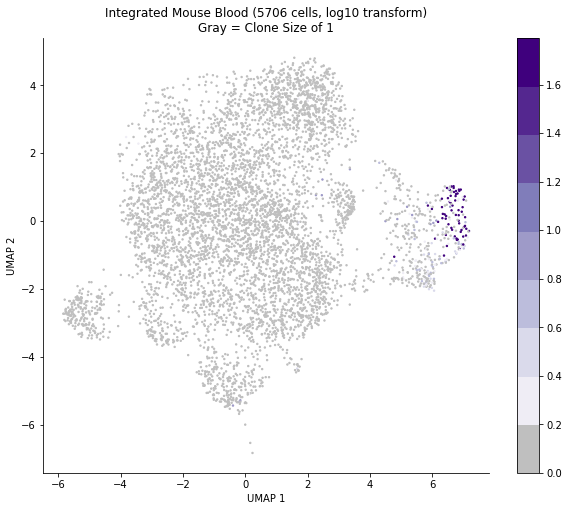

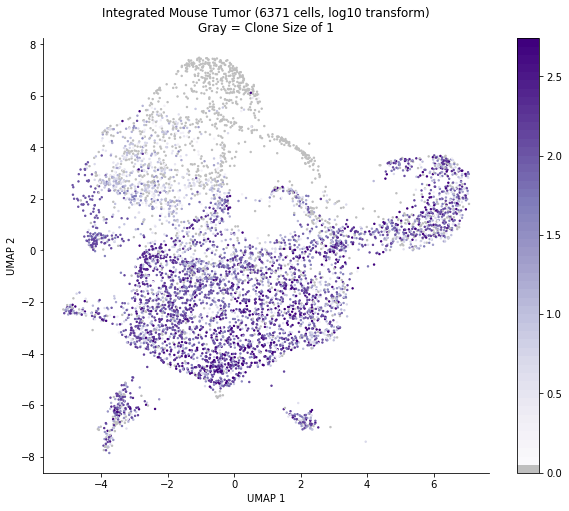

In [23]:
ExpansionPlotLog10(MouseIntBlood, 'Integrated Mouse Blood', save = True)
ExpansionPlotLog10(MouseIntTumor, 'Integrated Mouse Tumor', save = True)

# Count number and percent of matching cells (blood)

In [24]:
for i,sample in enumerate(samples):
    
    df = AB_Clones(Blood_adatas[i]).obs
    
    mtx = df[ df['Matching'] == 'matching' ]                      # All cells that are matching
    len_matching = len(mtx)                                       # Number of matching clones
    perc_matching = len(mtx)/len(df) * 100                        # Percent of matching clones
    
    print("For {}_Blood, there are {} matching cells, which are {:1.2f}% of cells.".format(sample,len_matching,perc_matching))

For M1_Blood, there are 183 matching cells, which are 10.08% of cells.
For M2_Blood, there are 22 matching cells, which are 1.22% of cells.
For M3_Blood, there are 28 matching cells, which are 1.34% of cells.
For M4_Blood, there are 277 matching cells, which are 11.44% of cells.
For M5_Blood, there are 344 matching cells, which are 13.07% of cells.


# Count number and percent of matching cells (tumor)

In [25]:
for i,sample in enumerate(samples):
    
    df = AB_Clones(Tumor_adatas[i]).obs
    
    mtx = df[ df['Matching'] == 'matching' ]                      # All cells that are matching
    len_matching = len(mtx)                                       # Number of matching clones
    perc_matching = len(mtx)/len(df) * 100                        # Percent of matching clones
    
    print("For {}_Tumor, there are {} matching cells, which are {:1.2f}% of cells.".format(sample,len_matching,perc_matching))

For M1_Tumor, there are 752 matching cells, which are 34.42% of cells.
For M2_Tumor, there are 1144 matching cells, which are 47.53% of cells.
For M3_Tumor, there are 239 matching cells, which are 13.43% of cells.
For M4_Tumor, there are 1640 matching cells, which are 69.70% of cells.
For M5_Tumor, there are 2267 matching cells, which are 75.72% of cells.


# Plot Integrated UMAPs by Matching condition

In [26]:
def MatchingUMAP(Adata, sample, save = False):
    
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    
    # Keep only AB cells
    df = AB_Clones(Adata).obs

    fig, ax = plt.subplots(figsize=(10,8))                              # Size of each figure

    scatter_colors = Colors[0:3]
    scatter_colors.append('#DCDCDC')

    
    # Scatterplot for all cells, colored by matching condition    
    sns.scatterplot(data = df, x = 'UMAP_1', y = 'UMAP_2', linewidth=0,
                    hue = 'Matching', hue_order = ['M1_matching', 'M2_matching', 'M3_matching', 'not_matching'],
                    ax=ax, s=5, palette = scatter_colors)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(sample + " ({} cells)".format(len(df)))                    # Add title

    m = ['M1_matching', 'M2_matching', 'M3_matching']
    
    new_labels = []
        
    for i,sample in enumerate(samples[:3]):  
        
        n_matching = len(df[ df['Matching'] == m[i] ])
        perc_matching = n_matching/len(df) * 100
        new_labels.append("{} Matching\n({} cells, {:1.2f}% matching)".format(sample,n_matching,perc_matching))

    new_labels.append('Not Matching')

        
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    plt.setp(ax.get_legend().get_texts(), fontsize='8')                 # For legend text
    ax.set_xlabel("UMAP 1")                                             # Label x-axis
    ax.set_ylabel("UMAP 2")                                             # Label y-axis
        
    if save is True:
        plt.savefig("Figures/Fig1D_MouseIntBlood_matching.pdf")
    

    plt.show()                                                          # Show the figure

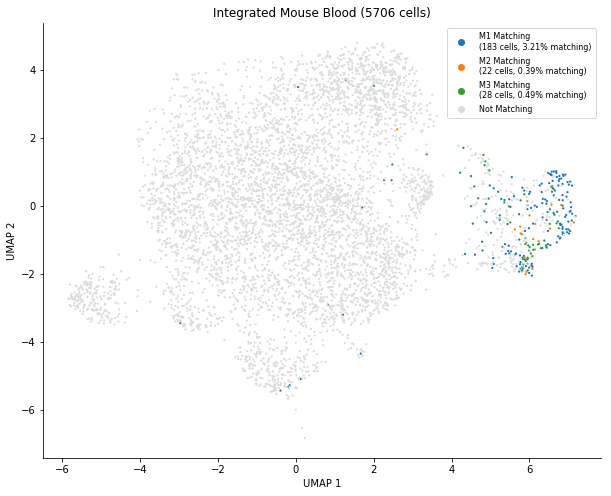

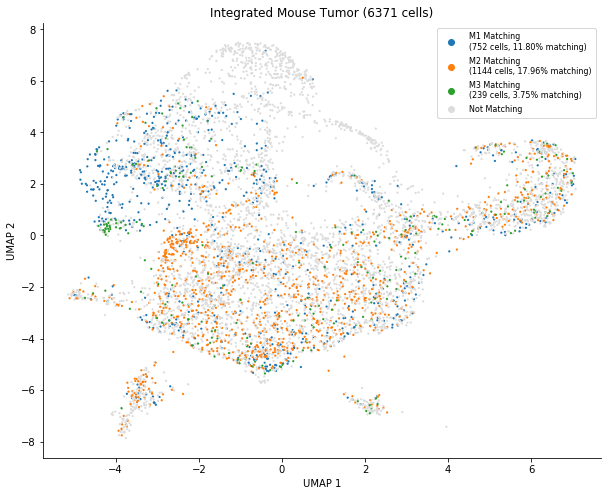

In [27]:
MatchingUMAP(MouseIntBlood, 'Integrated Mouse Blood', save = True)
MatchingUMAP(MouseIntTumor, 'Integrated Mouse Tumor')

# Plot Integrated UMAPs by Mouse Sample (Supplemental Figure 1C)

### Integrated Blood

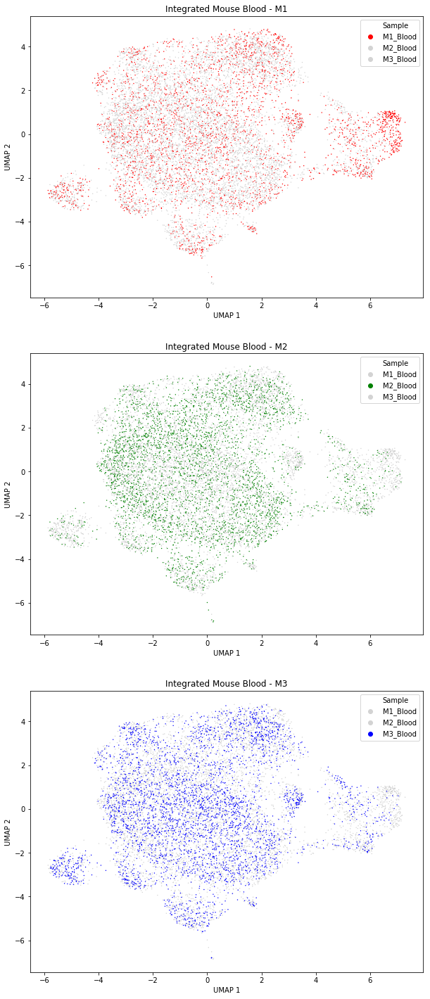

In [28]:
# Make three figures, one in each row
fig, ax = plt.subplots(nrows = 3, figsize = (10,25))



sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood.obs, hue = 'Sample',
                palette = ['red','lightgray','lightgray'], ax = ax[0], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood.obs, hue = 'Sample',
                palette = ['lightgray','green','lightgray'], ax = ax[1], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood.obs, hue = 'Sample',
                palette = ['lightgray','lightgray','blue'], ax = ax[2], linewidth = 0, s = 2)

ax[0].set_title('Integrated Mouse Blood - M1')
ax[1].set_title('Integrated Mouse Blood - M2')
ax[2].set_title('Integrated Mouse Blood - M3')

for axes in ax.flat:
    axes.set_xlabel('UMAP 1')
    axes.set_ylabel('UMAP 2')

plt.savefig('Figures/SuppFig1C_MouseIntBlood_bysample.pdf')

plt.show()

### Integrated Tumor

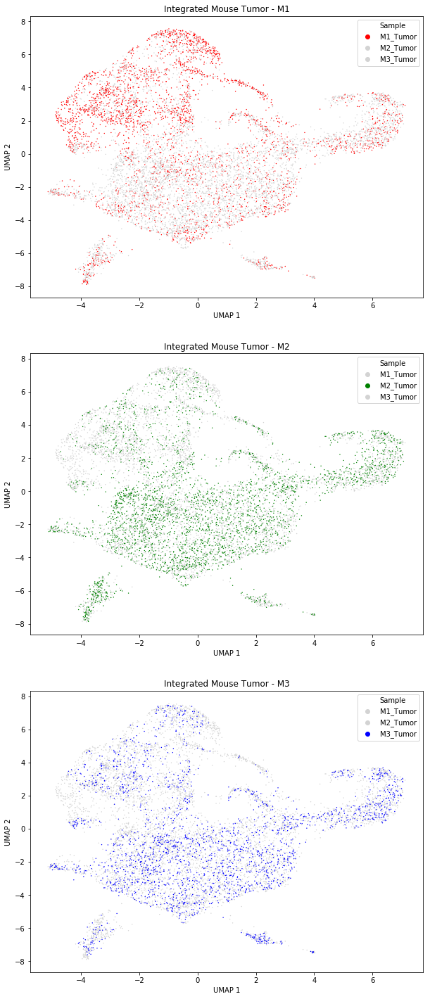

In [29]:
# Make three figures, one in each row
fig, ax = plt.subplots(nrows = 3, figsize = (10,25))



sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor.obs, hue = 'Sample',
                palette = ['red','lightgray','lightgray'], ax = ax[0], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor.obs, hue = 'Sample',
                palette = ['lightgray','green','lightgray'], ax = ax[1], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor.obs, hue = 'Sample',
                palette = ['lightgray','lightgray','blue'], ax = ax[2], linewidth = 0, s = 2)

ax[0].set_title('Integrated Mouse Tumor - M1')
ax[1].set_title('Integrated Mouse Tumor - M2')
ax[2].set_title('Integrated Mouse Tumor - M3')

for axes in ax.flat:
    axes.set_xlabel('UMAP 1')
    axes.set_ylabel('UMAP 2')

plt.savefig('Figures/SuppFig1C_MouseIntTumor_bysample.pdf')

plt.show()

# Plot Integrated UMAPs by Matching Conditions (Figure 3A and Supplemental Figure 1D)

### Integrated Blood

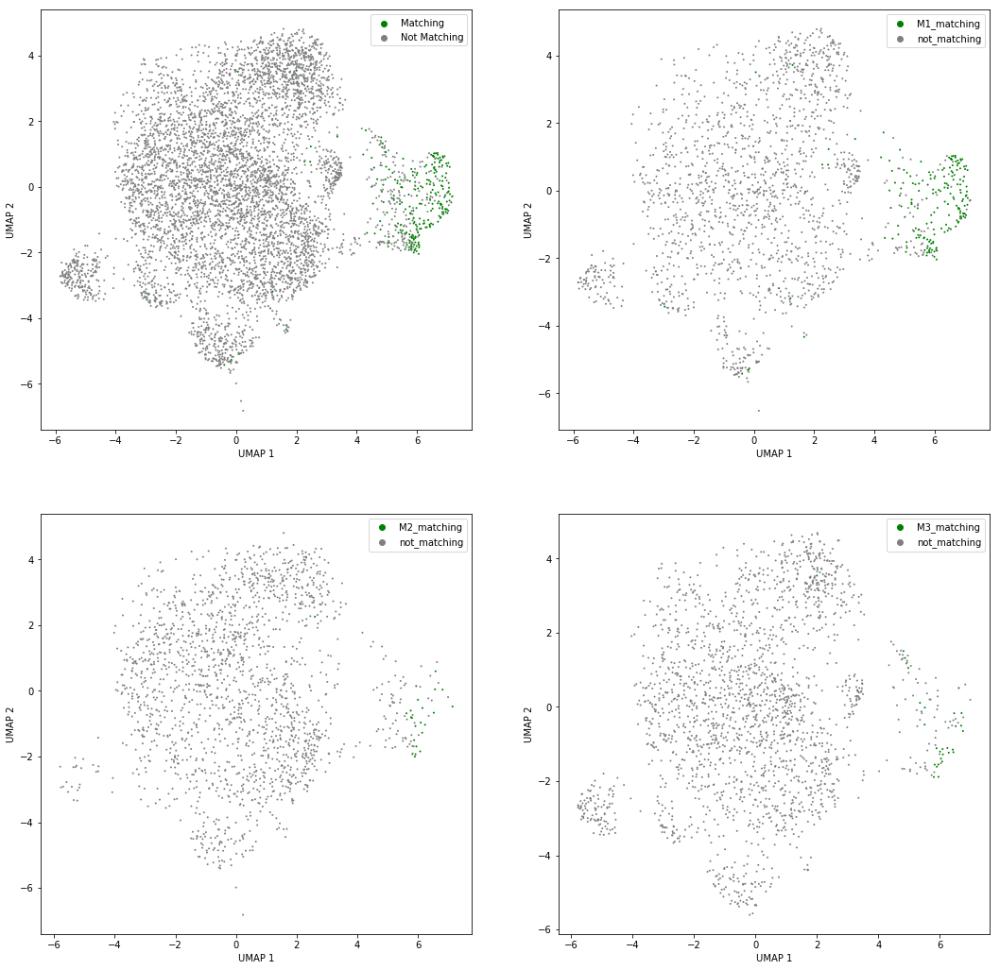

In [30]:
# Make four figures, two in each row
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (18,18))

df = AB_Clones(MouseIntBlood).obs.copy()


sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching',
                palette = ['green','green','green','gray'], ax = axes[0,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M1_Blood' ]
order = ['M1_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[0,1], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M2_Blood' ]
order = ['M2_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[1,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M3_Blood' ]
order = ['M3_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[1,1], linewidth = 0, s = 4)

for i,ax in enumerate(axes.flat):
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    handles, labels = ax.get_legend_handles_labels()
    
    # Special case: for top-left plot, keep matching binary (matching vs. not matching) only
    if i == 0:
        labels = ['Matching', 'Not Matching']
        handles = handles[-2:]
    else:
        labels = labels[1:]
        handles = handles[1:]
    
    ax.legend(handles=handles, labels=labels)
    


plt.savefig('Figures/SuppFig1D_MouseIntBlood_matching.pdf')

### Integrated Tumor

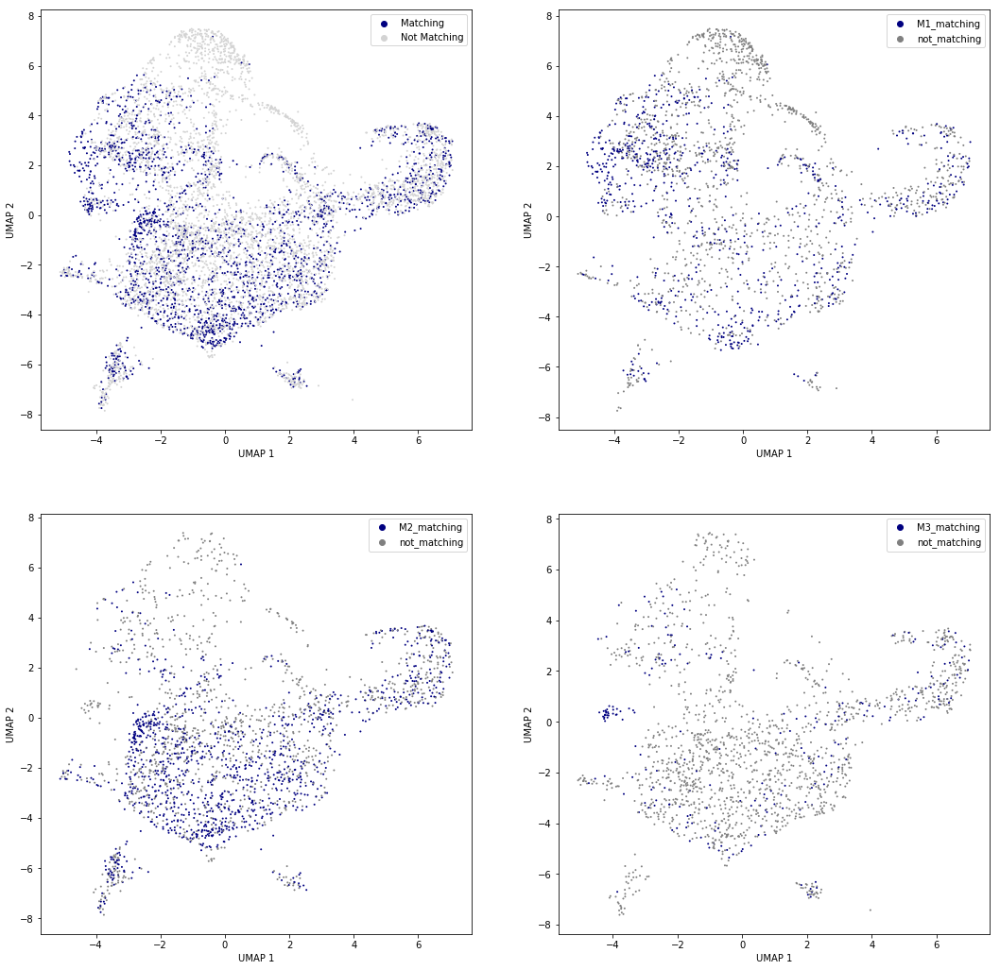

In [31]:
# Make four figures, two in each row
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (18,18))

df = AB_Clones(MouseIntTumor).obs.copy()


sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching',
                palette = ['navy','navy','navy','lightgray'], ax = axes[0,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M1_Tumor' ]
order = ['M1_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[0,1], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M2_Tumor' ]
order = ['M2_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[1,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M3_Tumor' ]
order = ['M3_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[1,1], linewidth = 0, s = 4)

for i,ax in enumerate(axes.flat):
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    handles, labels = ax.get_legend_handles_labels()
    
    # Special case: for top-left plot, keep matching binary (matching vs. not matching) only
    if i == 0:
        labels = ['Matching', 'Not Matching']
        handles = handles[-2:]
    else:
        labels = labels[1:]
        handles = handles[1:]
    
    ax.legend(handles=handles, labels=labels)

plt.savefig('Figures/SuppFig1D_MouseIntTumor_matching.pdf')

    
# Binary matching for Fig3A
extent = axes[0,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('Figures/Fig3A_MouseIntTumor_binary_matching.pdf', bbox_inches=extent.expanded(1.2, 1.2))

# Make Pie Charts

### Create Function

In [32]:
def MakePD1PieCharts(sample, Adata):
    
    # Keep the metadata
    df = AB_Clones(Adata).obs.copy()
    
    # Separate matching and non-matching cells
    M = df[ df['Matching'] != 'not_matching' ].index
    nM = df[ df['Matching'] == 'not_matching' ].index
    
    # Call gene column for PD1, matching cells
    PD1 = Adata[M, 'Pdcd1'].X
    
    # Number of M cells that are PD1+
    matching_pd1P = np.count_nonzero(PD1)
    
    # Number of M cells that are PD1-
    matching_pd1N = len(PD1) - matching_pd1P
    
    # Call gene column for PD1, nM cells
    PD1 = Adata[nM, 'Pdcd1'].X
    
    # Number of TM cells that are PD1+
    not_matching_pd1P = np.count_nonzero(PD1)
    
    # Number of TM cells that are PD1-
    not_matching_pd1N = len(PD1) - not_matching_pd1P
    
    # Make pie charts
    colors = ['#ff9999','#66b3ff']
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))

    # Pie chart, matching cells
    labels = ['PD1+\n({} cells)'.format(matching_pd1P), 'PD1-\n({} cells)'.format(matching_pd1N)]
    ax1.pie([matching_pd1P,matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%', colors = colors)
    ax1.axis('equal')
    ax1.set_title('Matching Cells ({} cells)'.format(len(M)))

    # Pie chart, non-matching cells
    labels = ['PD1+\n({} cells)'.format(not_matching_pd1P), 'PD1-\n({} cells)'.format(not_matching_pd1N)]
    ax2.pie([not_matching_pd1P,not_matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%',
           colors = colors)
    ax2.axis('equal')
    ax2.set_title('Non-Matching Cells ({} cells)'.format(len(nM)))
    
    fig.suptitle(sample + ' ({} cells)\n\n\n\n'.format(len(df)))
    
    return (ax1, ax2)

### Individual Samples

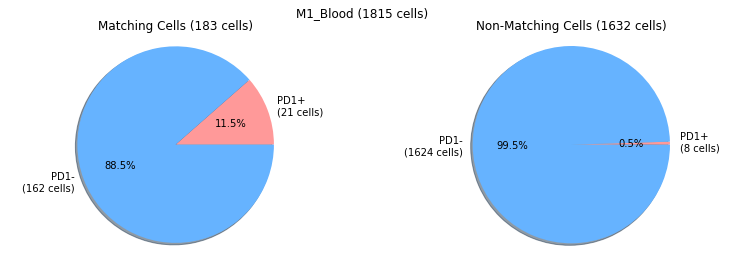

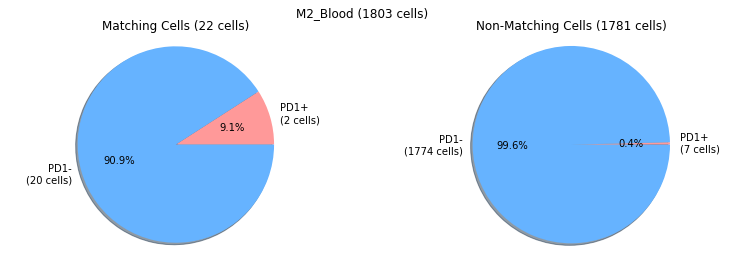

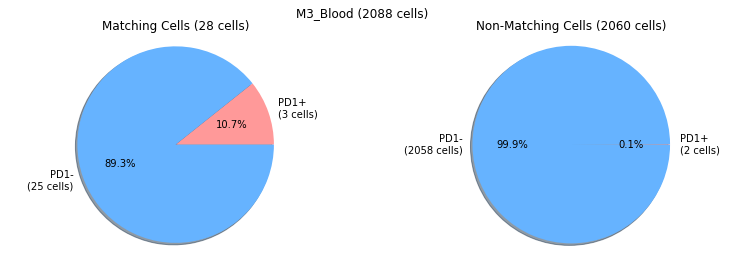

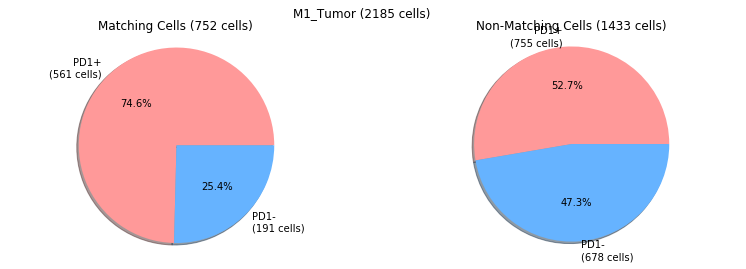

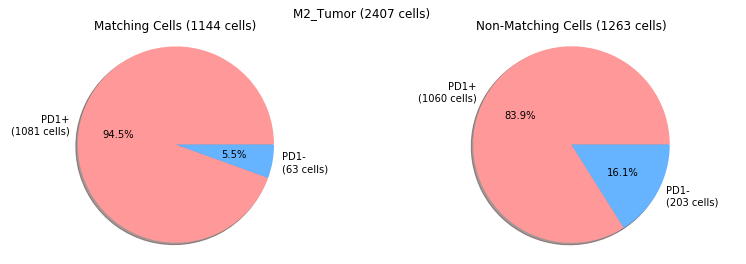

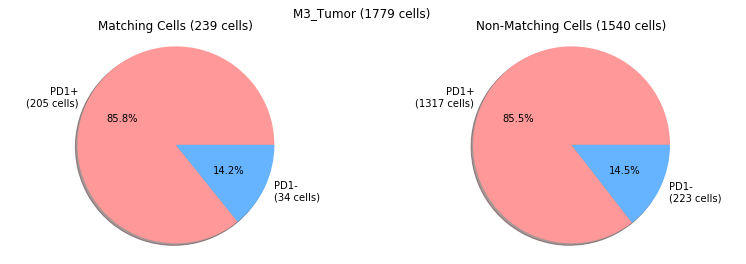

In [33]:
# Loop for blood samples
for i,sample in enumerate(samples[:3]):
    
    sample = sample + '_Blood'
    
    ax1, ax2 = MakePD1PieCharts(sample, Blood_adatas[i])
    plt.show()
    
# Loop for tumor samples
for i,sample in enumerate(samples[:3]):
    
    sample = sample + '_Tumor'
    
    ax1, ax2 = MakePD1PieCharts(sample, Tumor_adatas[i])
    plt.show()

### Integrated Objects

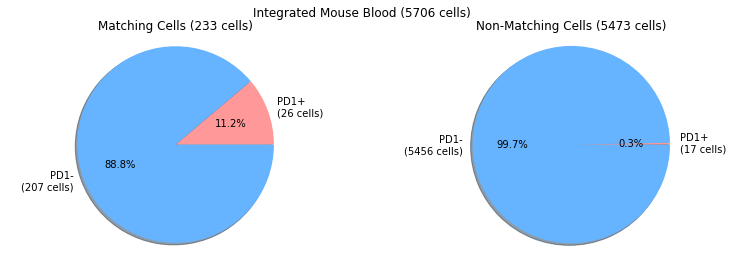

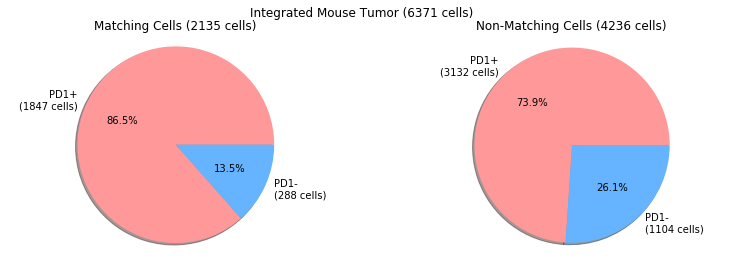

In [34]:
# Integrated Blood
ax1, ax2 = MakePD1PieCharts('Integrated Mouse Blood', MouseIntBlood)
plt.savefig('Figures/Fig1H_MouseIntBlood_PD1piechart.pdf')

# Integrated Tumor
ax1, ax2 = MakePD1PieCharts('Integrated Mouse Tumor', MouseIntTumor)

# UMAP of Gene Signatures

### Make Functions

In [35]:
def CapScores(score_list, thresh_low = 3, thresh_high = 3):
    """
    This function takes a list of gene scores (one score per cell) and fits it to a normal distribution,
    estimating a mean (mu) and standard deviation (SD). Then it caps the scores that are above a certain
    threshold and caps the scores that are below another threshold.
    
    This action should only be done for visualization purposes, and not for doing any statistical tests.
    
    Inputs
    ------
    score_list: A list of gene scores.
    thresh_low:  The number of standard deviations away from the mean to cap the lower scores.
    thresh_high: The number of standard deviations away from the mean to cap the upper scores.
    
    For both thresholds, the default behavior is that any scores that are 3 SDs above or
    below the mean will be capped.
    
    Output
    ------
    score_list: The capped list of gene scores.
    """
    
    # Fit the gene scores to a normal distribution
    mu, SD = scipy.stats.norm.fit(score_list)
    
    # Cap the scores
    thresh_high = mu + thresh_high * SD
    thresh_low  = mu - thresh_low  * SD
    
    for e,ele in enumerate(score_list):
        
        if ele >= thresh_high:
            score_list[e] = thresh_high
            
        if ele <= thresh_low:
            score_list[e] = thresh_low
            
    return score_list

In [36]:
def GeneSignatureUMAP(sample, Adata, gene_list, gene_list_name):
    """
    GeneSignatureUMAP calculates the gene scores for all the cells in a given AnnData object, and
    displays them on a UMAP.
    
    Inputs
    ------
    sample: Sample name.
    Adata: AnnData object.
    gene_list: A list of gene names to calculate gene scores.
    gene_list_name: The name of the gene list (ex: Activation, Naive, etc)
    
    Outputs
    -------
    fig, ax object.
    """
    
    pd.options.mode.chained_assignment = None
    
    # Set up the figure and axis
    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10,8))
    
    # Find intersection of genes between Adata object and gene list
    genes_to_plot = IntersectionOfGenes(Adata, gene_list)
    
    # Run the score_genes module
    sc.tl.score_genes(Adata, genes_to_plot, score_name = gene_list_name)
    
    # Cap gene scores
    Adata.obs[gene_list_name] = CapScores(Adata.obs[gene_list_name])
    
    # Make a scatter plot
    im = ax.scatter(Adata.obs['UMAP_1'], Adata.obs['UMAP_2'],
                    c = Adata.obs[gene_list_name], s = 2, cmap=plt.cm.get_cmap('Reds'),
                    edgecolor = None)

    title = '{} Genes, {} ({} cells)'.format(gene_list_name, sample, len(Adata))

    ax.set_title(title)
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    plt.colorbar(im, cax=cax, orientation='vertical')

    #fig.suptitle("\n{} Genes".format(gene_names[i]))
    return fig, ax

### Make copy of data, normalize (so we can use non-normalized counts later as needed)

In [37]:
Blood = MouseIntBlood.copy()
Tumor = MouseIntTumor.copy()

sc.pp.normalize_per_cell(Blood, counts_per_cell_after=1e4)
sc.pp.normalize_per_cell(Tumor, counts_per_cell_after=1e4)

sc.pp.log1p(Blood)
sc.pp.log1p(Tumor)

sc.pp.scale(Blood)
sc.pp.scale(Tumor)

### Make Plots

In [38]:
# Define gene lists and names
gene_lists = [sarkar_activation, cellcycle, kaech_naive, TRM, bystander, progenitorexh, terminallyexh]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)', 'Tissue Resident Memory',
              'Bystander', 'Progenitor Exhausted', 'Terminally Exhausted']

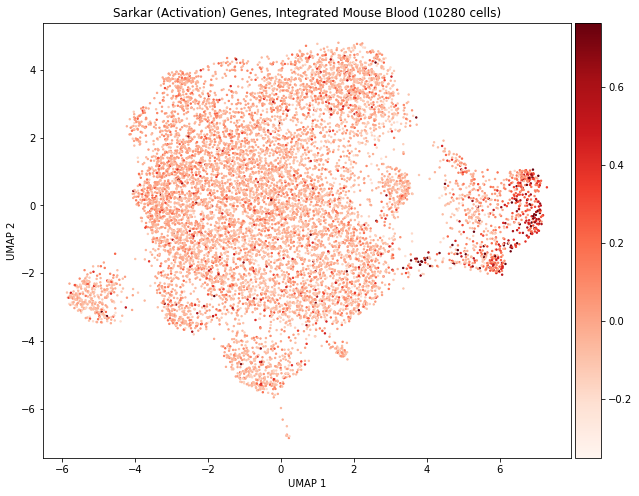

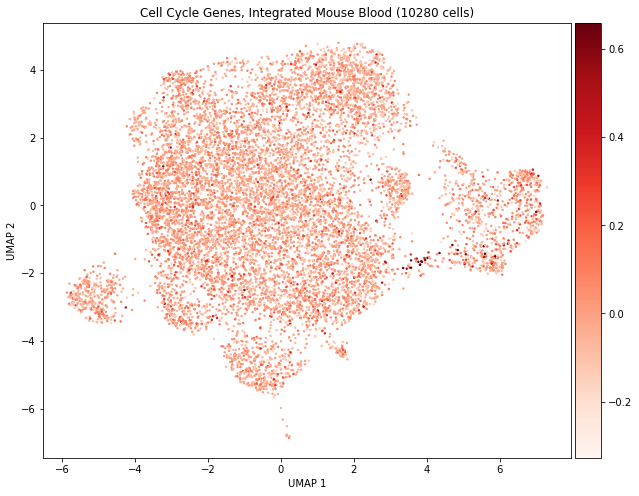

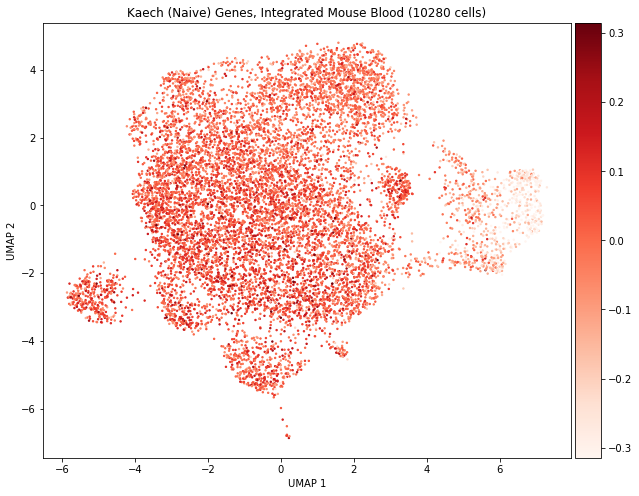

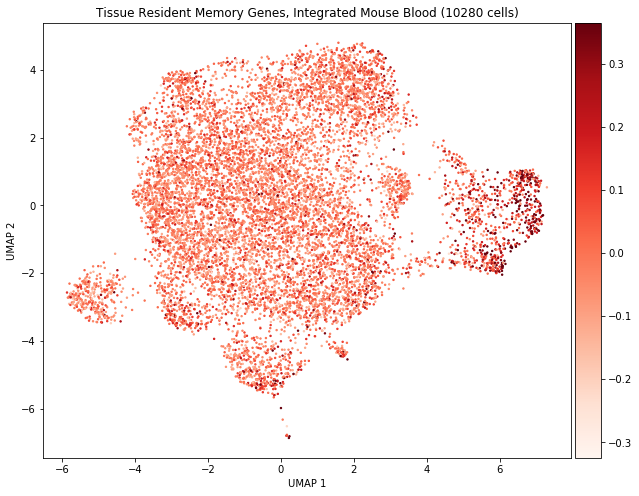

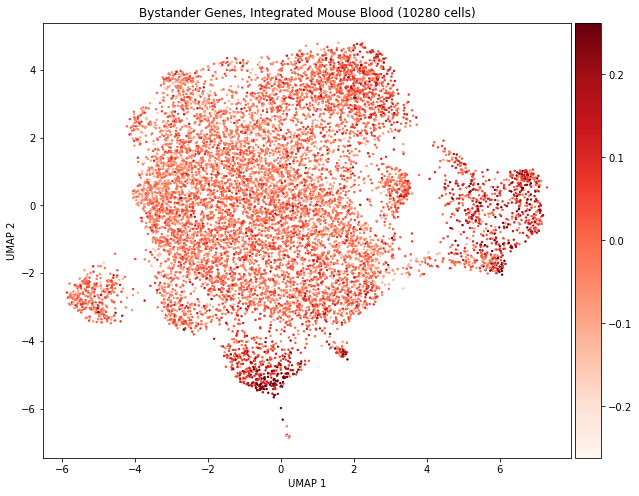

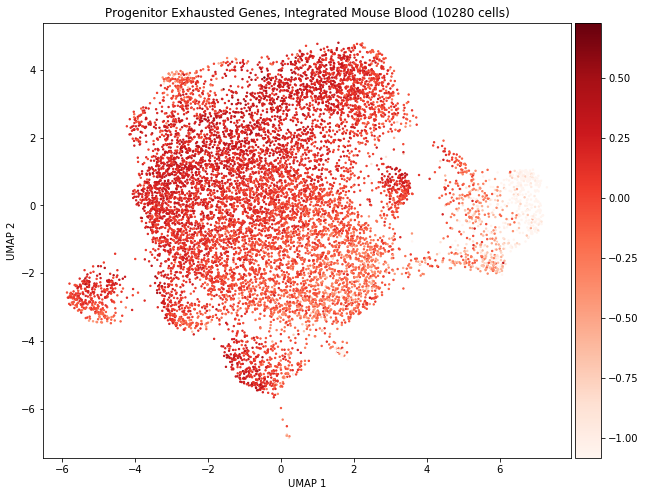

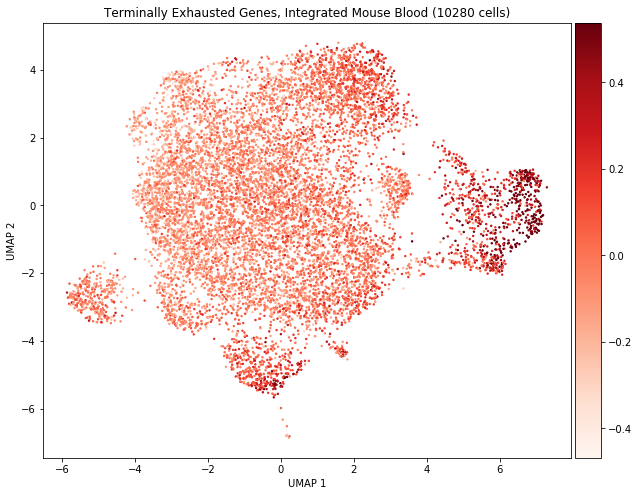

In [39]:
# Loop over gene lists for integrated blood
for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
    fig, ax = GeneSignatureUMAP('Integrated Mouse Blood', Blood, gene_list, gene_name)
    
    if gene_name == 'Sarkar (Activation)':
        plt.savefig('Figures/Fig1F_MouseIntBlood_ActivationUMAP.pdf')
        
    if gene_name == 'Cell Cycle':
        plt.savefig('Figures/SuppFig1H_MouseIntBlood_CellCycleUMAP.pdf')
        
    if gene_name == 'Kaech (Naive)':
        plt.savefig('Figures/SuppFig1I_MouseIntBlood_NaiveUMAP.pdf')
        
    if gene_name == 'Tissue Resident Memory':
        plt.savefig('Figures/SuppFig1J_MouseIntBlood_TRM_UMAP.pdf')
    
    plt.show()

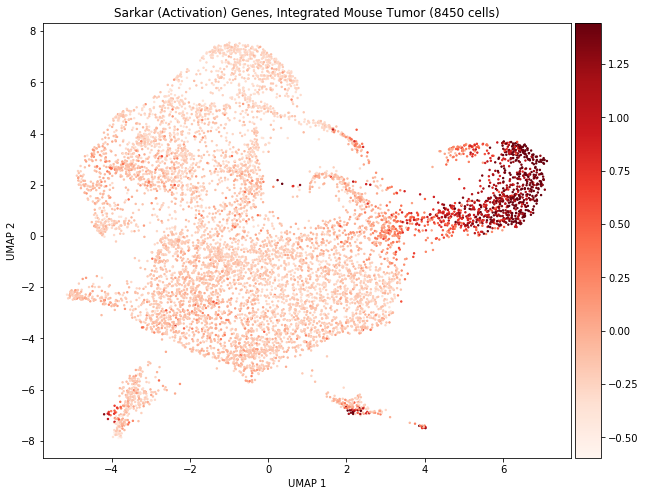

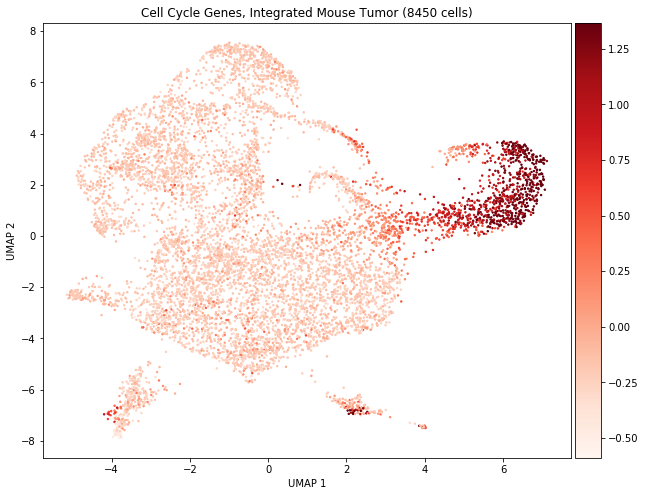

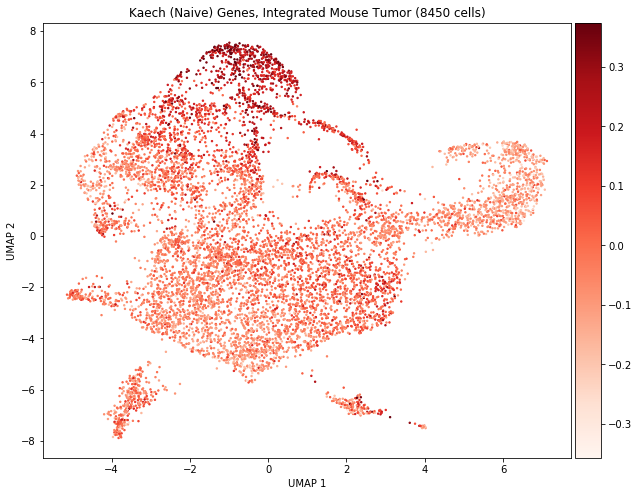

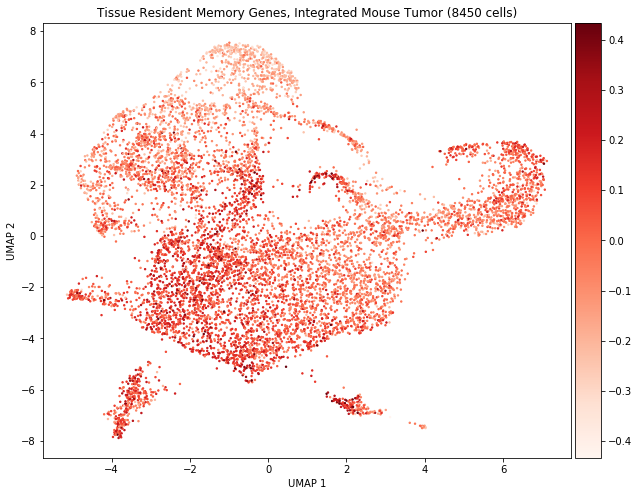

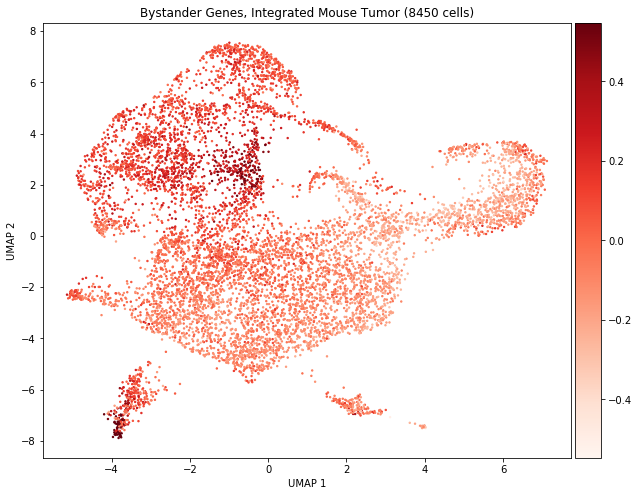

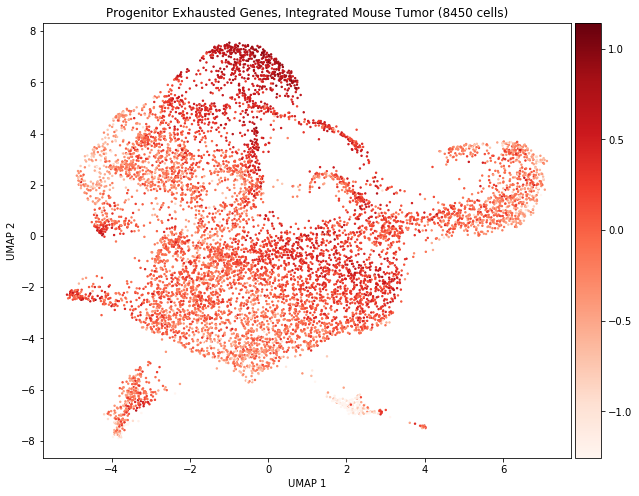

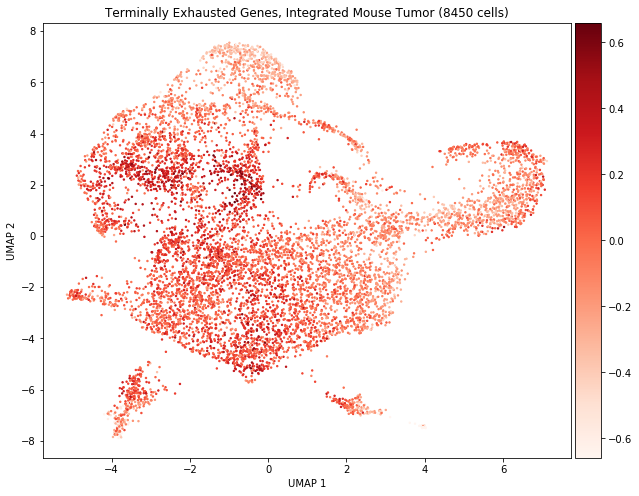

In [40]:
# Loop over gene lists for integrated tumor
for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
    fig, ax = GeneSignatureUMAP('Integrated Mouse Tumor', Tumor, gene_list, gene_name)
    
    if gene_name == 'Cell Cycle':
        plt.savefig('Figures/SuppFig3B_MouseIntTumor_CellCycleUMAP.pdf')
        
    if gene_name == 'Kaech (Naive)':
        plt.savefig('Figures/SuppFig3B_MouseIntTumor_NaiveUMAP.pdf')
        
    if gene_name == 'Tissue Resident Memory':
        plt.savefig('Figures/SuppFig3B_MouseIntTumor_TRM_UMAP.pdf')
        
    if gene_name == 'Bystander':
        plt.savefig('Figures/SuppFig3B_MouseIntTumor_BystanderUMAP.pdf')
        
    if gene_name == 'Terminally Exhausted':
        plt.savefig('Figures/SuppFig3B_MouseIntTumor_TerminallyExhUMAP.pdf')
    
    plt.show()

# Box Plots

### Create Function

In [41]:
def BoxPlots(sample, Blood_adata, Tumor_adata):
    
    pd.options.mode.chained_assignment = None    # Turn off this warning
    
    df_blood = AB_Clones(Blood_adata).obs.copy()
    df_tumor = AB_Clones(Tumor_adata).obs.copy()
    
    # Prepare the figures
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,10))

    # Make boxplots for blood
   
    # Plot
    df_blood['logClone_size'] = np.log10(df_blood['Clone.size'])               # Add log10('Clone.size')
    df_blood.drop_duplicates(subset = 'TCR', keep = 'first', inplace = True)   # Keep each TCR once
    
    # Make a column in df_tumor for the x-label of boxplots
    df_blood['Tumor Matching'] = ['nTM' if match == 'not_matching' else 'TM' for match in df_blood['Matching']]
    
    # Separate by matching
    TM =  df_blood[ df_blood['Matching'] != 'not_matching' ]
    nTM = df_blood[ df_blood['Matching'] == 'not_matching' ]
    
    # Calculate statistics
    stats,pval = scipy.stats.ranksums(TM['Clone.size'], nTM['Clone.size'])
    diff_mean = np.mean(TM['Clone.size']) - np.mean(nTM['Clone.size'])
    diff_median = np.median(TM['Clone.size']) - np.median(nTM['Clone.size'])
    
    
    # Plot for blood
    sns.boxplot(x = 'Tumor Matching', y = 'Clone.size', data = df_blood, order = ['nTM', 'TM'], ax = ax[0,0])
    title1 = sample + ' Blood\n'
    title2 = 'p-val = {:.2g}\n'.format(pval)
    title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
    title4 = 'Difference in medians = {:.2g}'.format(diff_median)
    title = title1 + title2 + title3 + title4
    ax[0,0].set_title(title)
    
    
    sns.boxplot(x = 'Tumor Matching', y = 'logClone_size', data = df_blood, order = ['nTM', 'TM'], ax = ax[0,1])
    ax[0,1].set_title('{} Blood (log10[Clone size])\np-val = {:.2g}'.format(sample,pval))
    ax[0,1].set_ylabel('log$_{10}$(Clone size)')


    
    # Make boxplots for tumor
    

    
    # Plot
    df_tumor['logClone_size'] = np.log10(df_tumor['Clone.size'])               # Add log10('Clone.size')
    df_tumor.drop_duplicates(subset = 'TCR', keep = 'first', inplace = True)   # Keep each TCR once
    
    # Make a column in df_tumor for the x-label of boxplots
    df_tumor['Blood Matching'] = ['nBM' if match == 'not_matching' else 'BM' for match in df_tumor['Matching']]
    
    
    # Separate by matching
    BM =  df_tumor[ df_tumor['Matching'] != 'not_matching' ]
    nBM = df_tumor[ df_tumor['Matching'] == 'not_matching' ]
    
    # Calculate statistics
    stats,pval = scipy.stats.ranksums(BM['Clone.size'], nBM['Clone.size'])
    diff_mean = np.mean(BM['Clone.size']) - np.mean(nBM['Clone.size'])
    diff_median = np.median(BM['Clone.size']) - np.median(nBM['Clone.size'])
    
    
    # Plot for tumor
    sns.boxplot(x = 'Blood Matching', y = 'Clone.size', data = df_tumor, order = ['nBM', 'BM'], ax = ax[1,0])
    title1 = sample + ' Tumor\n'
    title2 = 'p-val = {:.2g}\n'.format(pval)
    title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
    title4 = 'Difference in medians = {:.2g}'.format(diff_median)
    title = title1 + title2 + title3 + title4
    ax[1,0].set_title(title)
    
    
    sns.boxplot(x = 'Blood Matching', y = 'logClone_size', data = df_tumor, order = ['nBM', 'BM'], ax = ax[1,1])
    ax[1,1].set_title('{} Tumor (log10[Clone size])\np-val = {:.2g}'.format(sample,pval))
    ax[1,1].set_ylabel('log$_{10}$(Clone size)')  
    
    

    return ax
    

### Run on Invidivual Samples

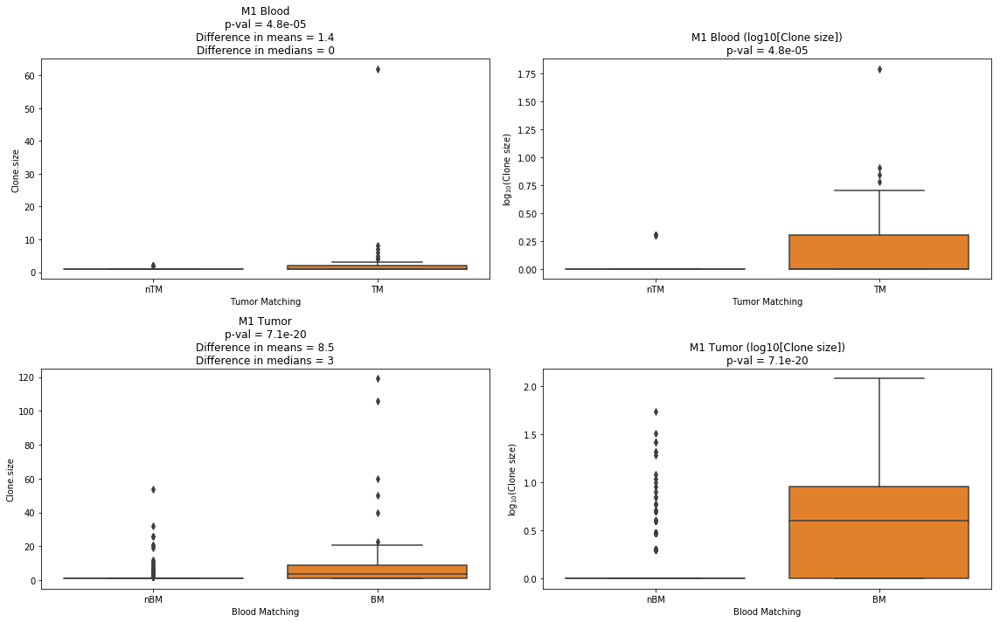

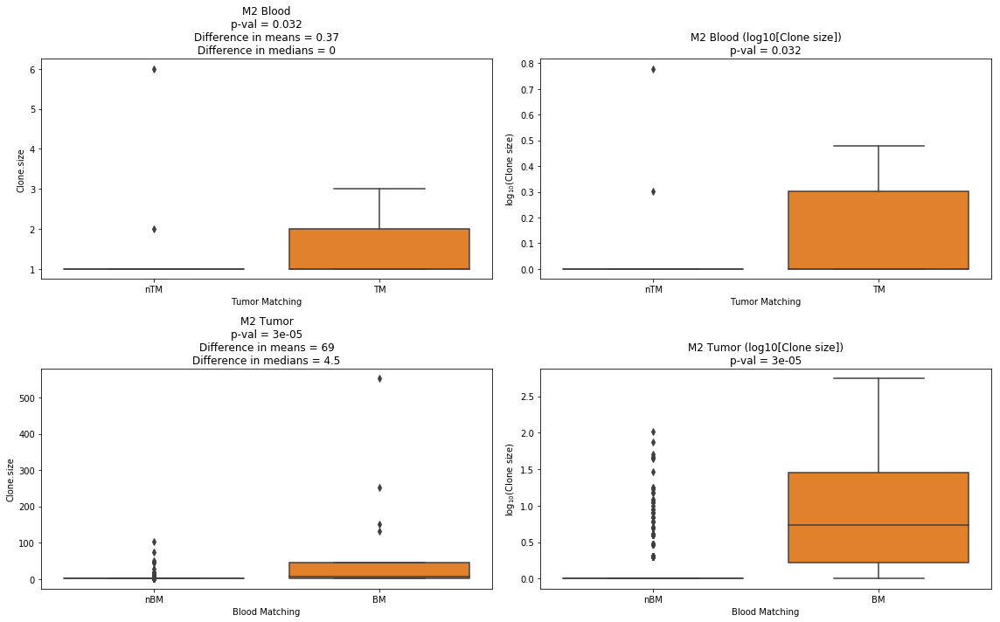

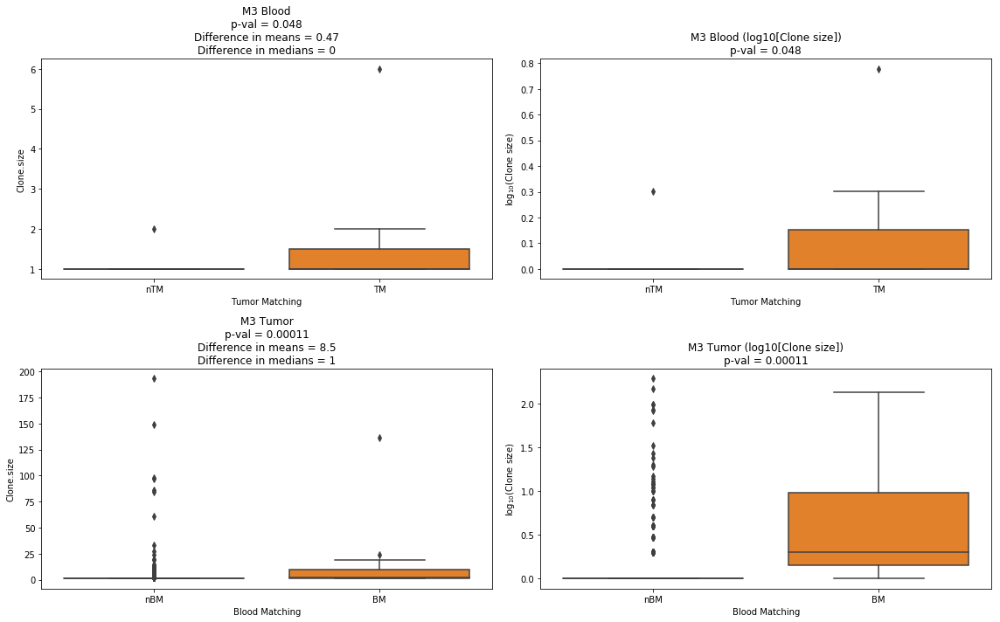

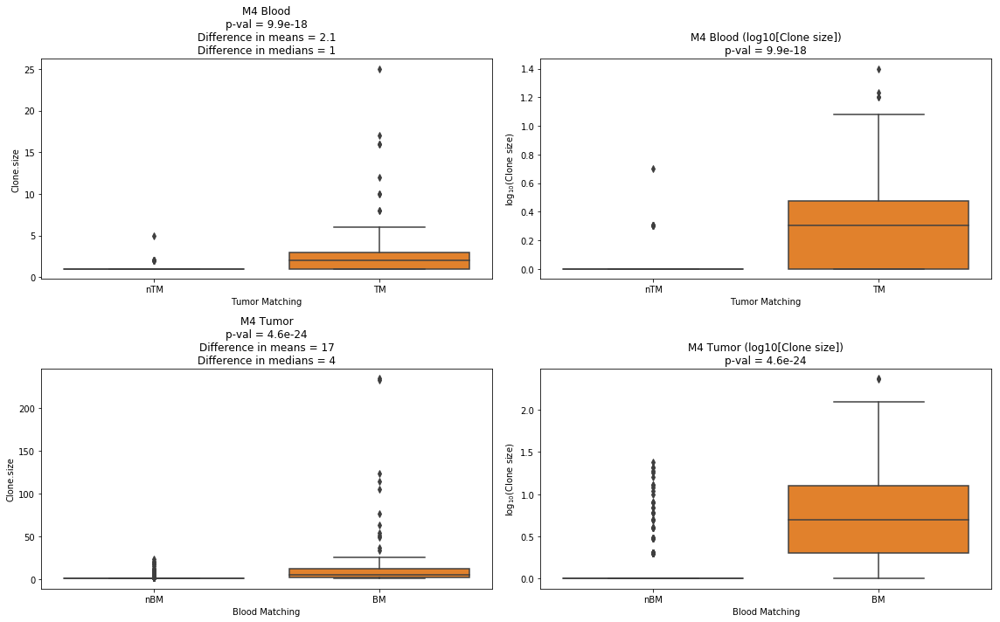

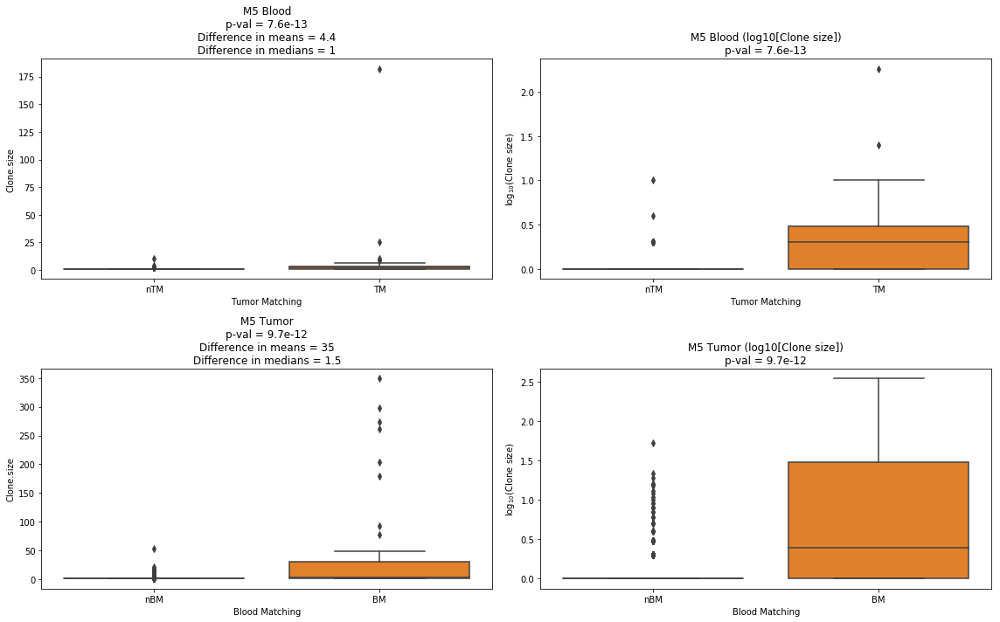

In [42]:
for i,sample in enumerate(samples):
    
    ax = BoxPlots(sample, Blood_adatas[i], Tumor_adatas[i])
    
    plt.tight_layout()
    plt.show()


### Run on Integrated Samples (Figures 1G and 3C)

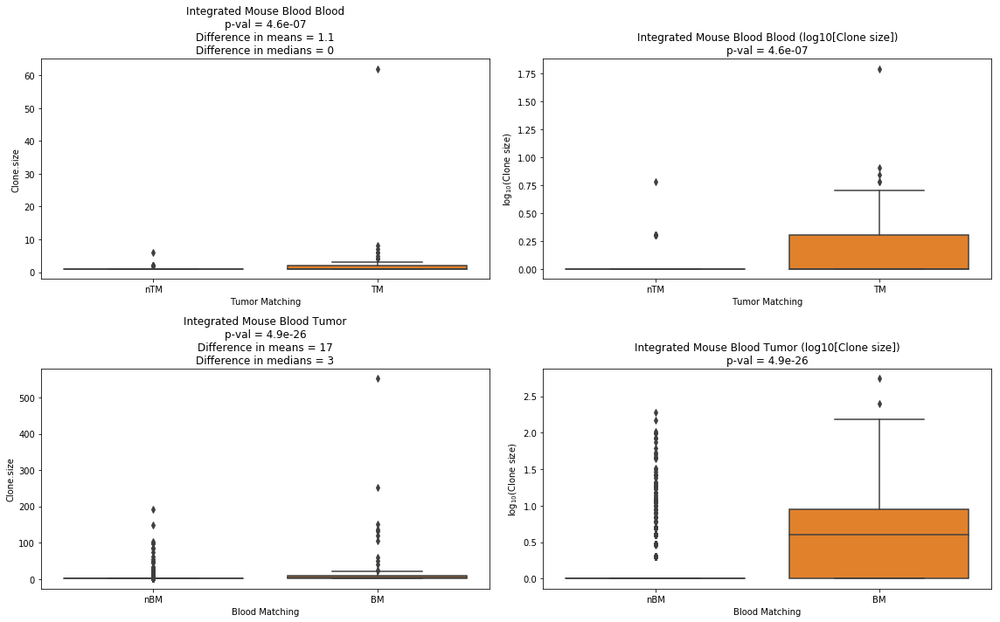

In [43]:
ax = BoxPlots('Integrated Mouse Blood', MouseIntBlood, MouseIntTumor)

plt.tight_layout()
plt.savefig('Figures/Fig1G_Fig3C_Boxplots.pdf')
plt.show()

# Violin Plots

### Create Functions

In [44]:
def MakeViolinPlots(sample, Adata, gene_lists, gene_names, figsize = (10,8), Cap = False):
    
    # Keep only AB cells
    Adata = AB_Clones(Adata).copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    # Label cell as 'M' or 'nM' for 'Matching' or 'Not Matching'
    Adata.obs['Matching'] = ['nM' if match == 'not_matching' else 'M' for match in Adata.obs['Matching'] ]
    
    
    # Make the figure and axes
    fig, axes = MakeFigAxes(ncols = 2, n_axes = len(gene_lists), figsize = figsize)
    
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
        # Find the intersection of the gene list and the genes in the adata object
        genes_to_plot = IntersectionOfGenes(Adata, gene_list)

        # Find gene scores
        sc.tl.score_genes(Adata, genes_to_plot, score_name = gene_name)

        # Create two lists to calculate statistics
        M = Adata[ Adata.obs['Matching'] == 'M' ].obs
        nM = Adata[ Adata.obs['Matching'] == 'nM' ].obs

        # p-value and differences
        stat,pval = scipy.stats.ranksums(M[gene_name], nM[gene_name])
        diff_mean = np.mean(M[gene_name]) - np.mean(nM[gene_name])
        diff_median = np.median(M[gene_name]) - np.median(nM[gene_name])
        
        # Cap scores, if specified, for visualization
        if Cap == True:
            Adata.obs[gene_name] = CapScores(Adata.obs[gene_name])
            
        # Get axis
        ax = axes.flatten()[i]
    
        sns.violinplot(x = 'Matching', y = gene_name, data = Adata.obs, ax = ax, order = ['nM','M'])

        title1 = sample + ', {} genes\n'.format(gene_name)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        ax.set_title(title)
        ax.set_ylabel(gene_name)
        
    # Tight layout
    plt.tight_layout()
    
    return fig,axes

### Load gene lists

In [45]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)']

### Run on Individual Samples

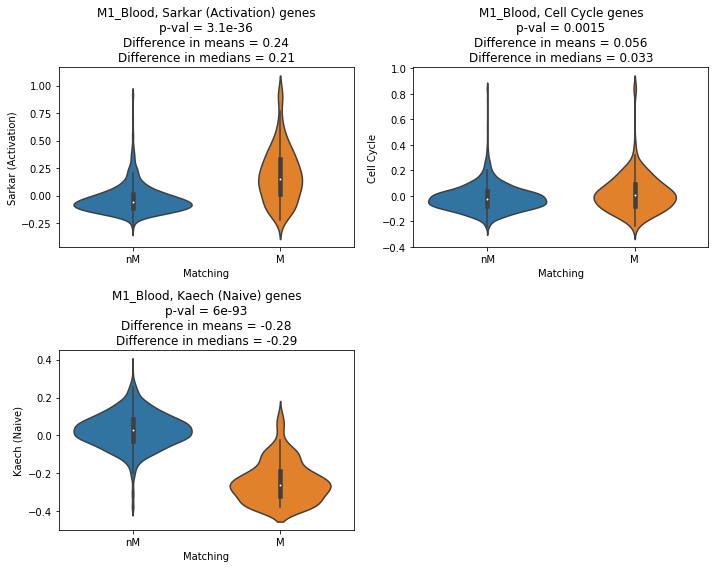

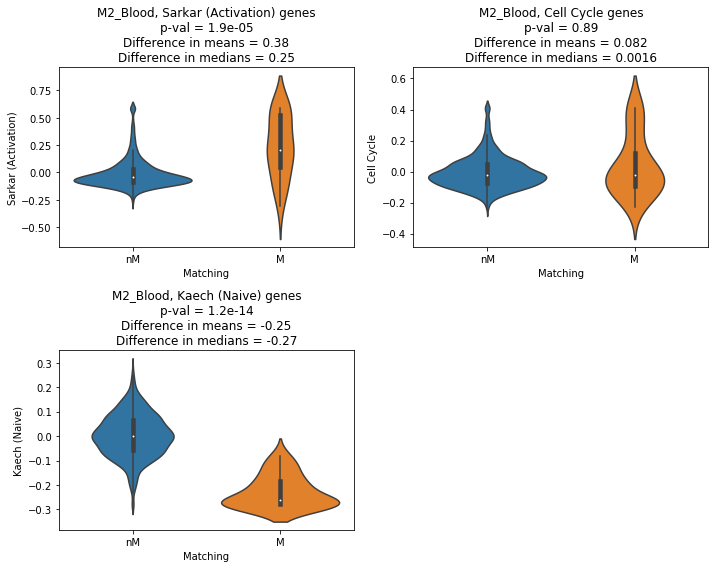

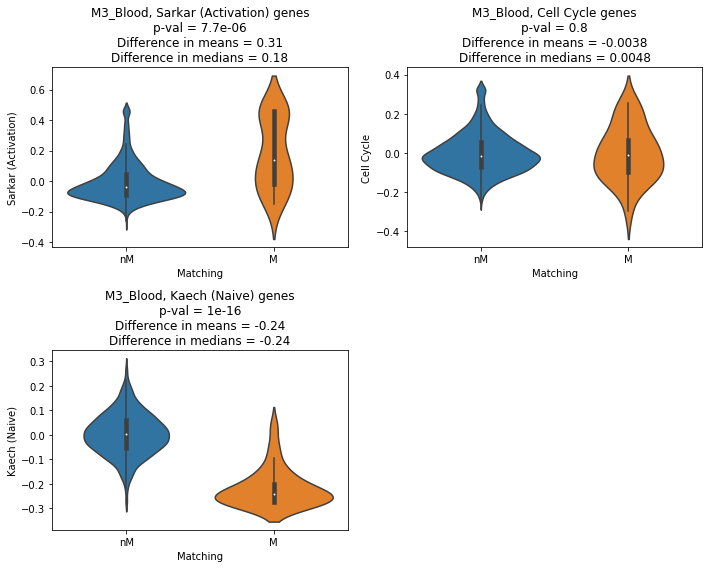

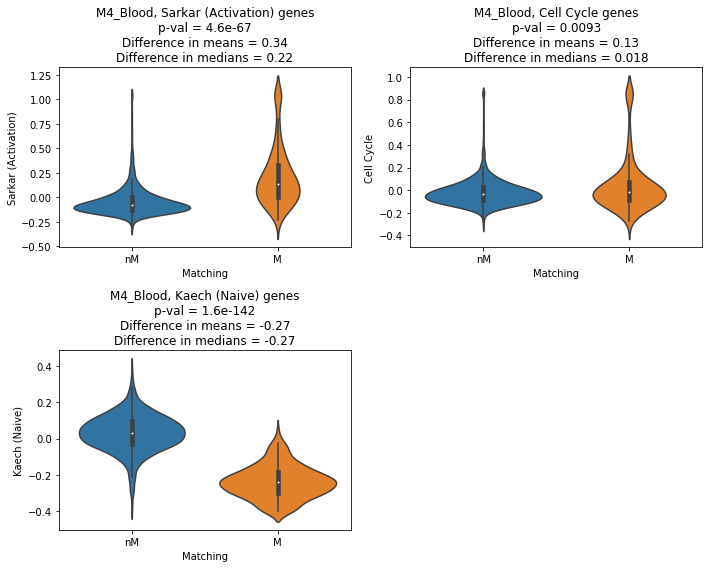

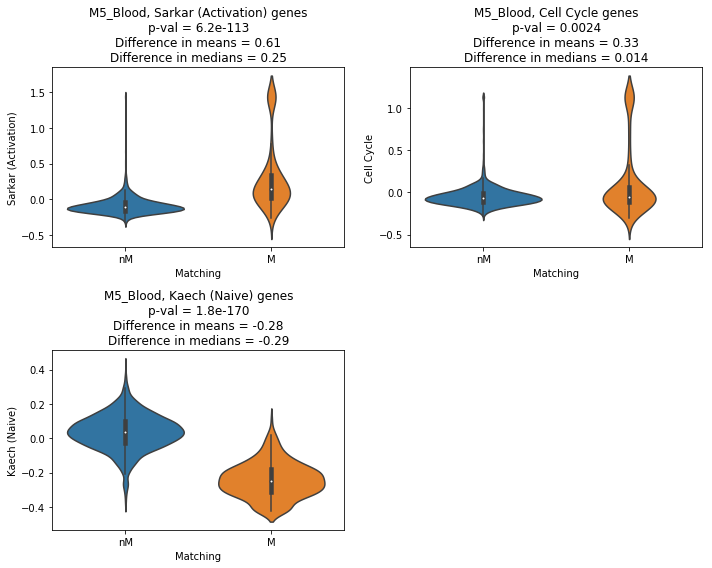

In [46]:
# Loop over blood data
for i,sample in enumerate(samples):
    
    sample = sample + '_Blood'
    fig, axes = MakeViolinPlots(sample, Blood_adatas[i], gene_lists, gene_names, Cap = True)
    plt.show()

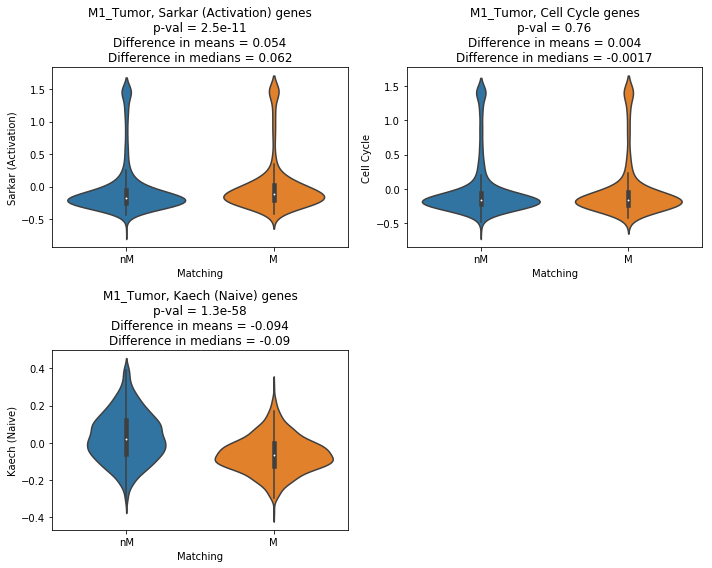

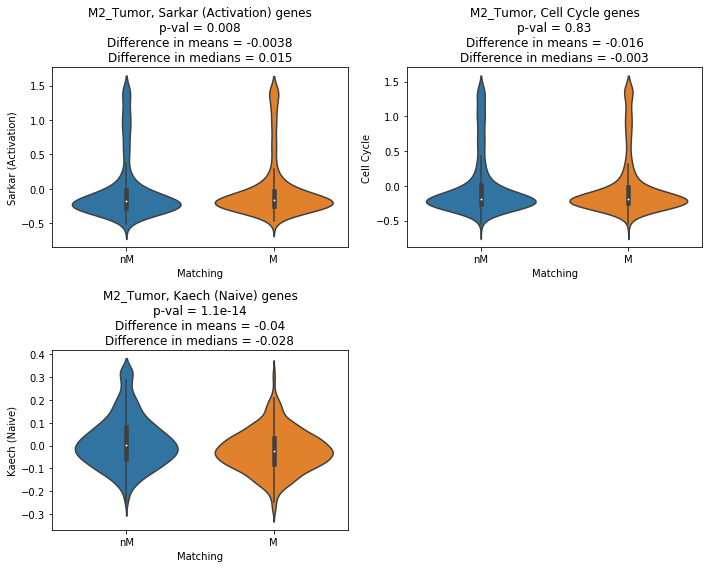

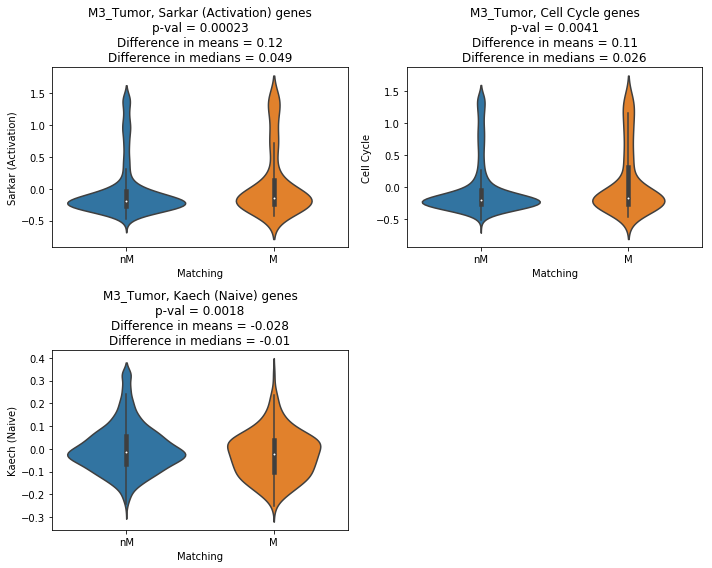

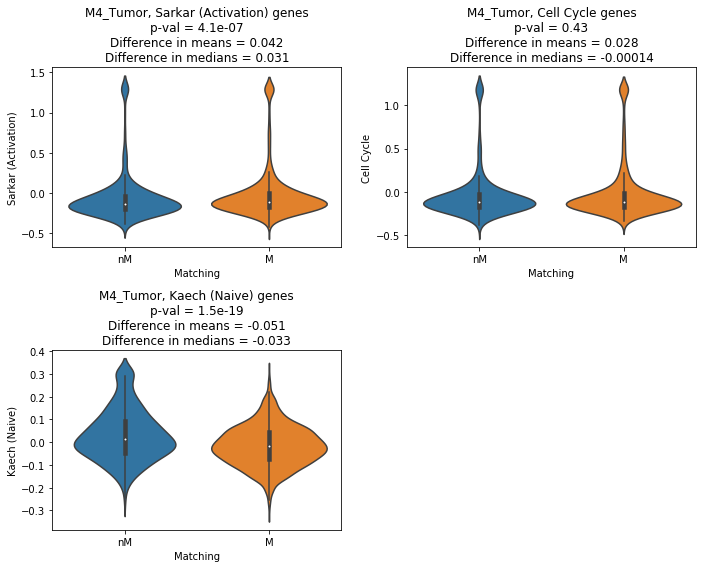

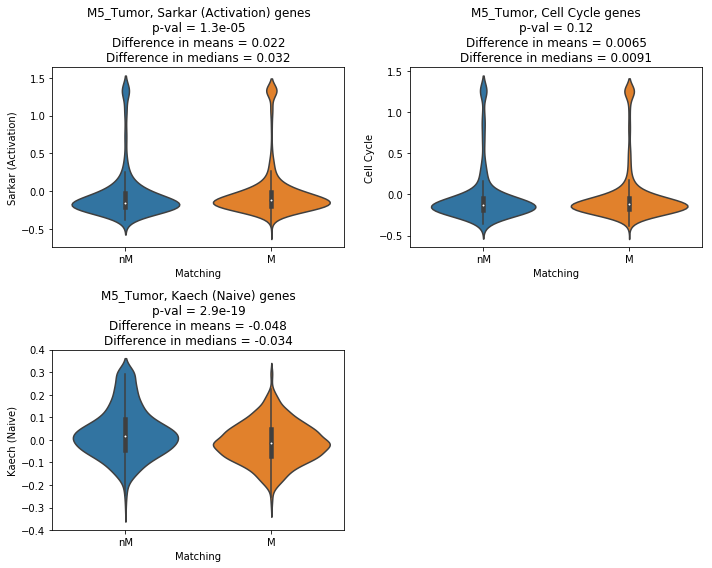

In [47]:
# Loop over blood data
for i,sample in enumerate(samples):
    
    sample = sample + '_Tumor'
    fig, axes = MakeViolinPlots(sample, Tumor_adatas[i], gene_lists, gene_names, Cap = True)
    plt.show()

### Run on Integrated Samples

In [48]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive, TRM, bystander, progenitorexh, terminallyexh]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)', 'Tissue Resident Memory',
              'Bystander', 'Progenitor Exhausted', 'Terminally Exhausted']

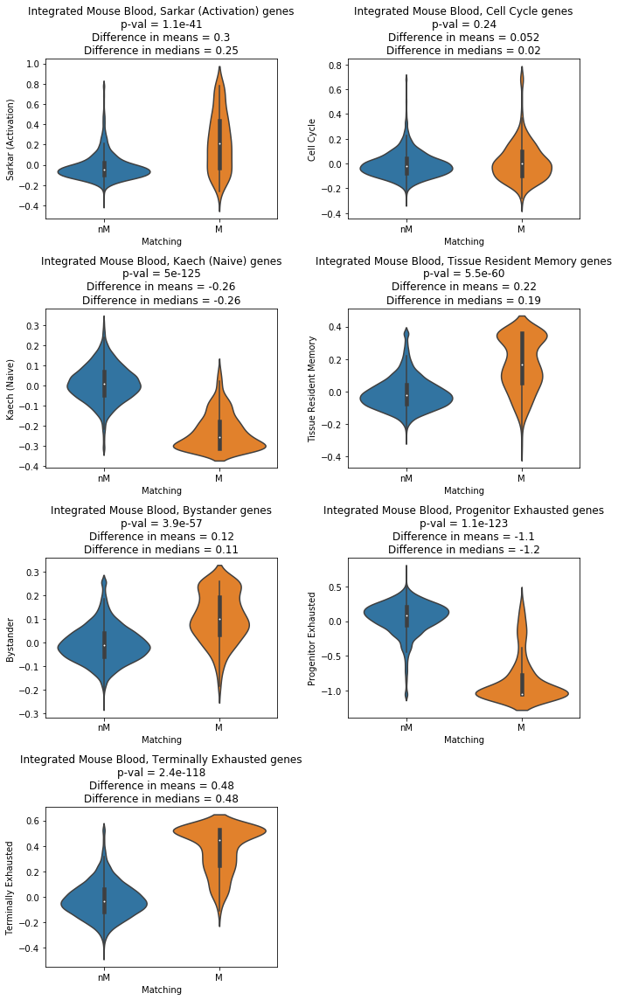

In [49]:
fig, axes = MakeViolinPlots('Integrated Mouse Blood', MouseIntBlood, gene_lists, gene_names,
                            figsize = (10,16), Cap = True)
plt.savefig('Figures/Fig1F_SuppFig1HIJ_MouseIntBlood_ViolinPlots.pdf')
plt.show()

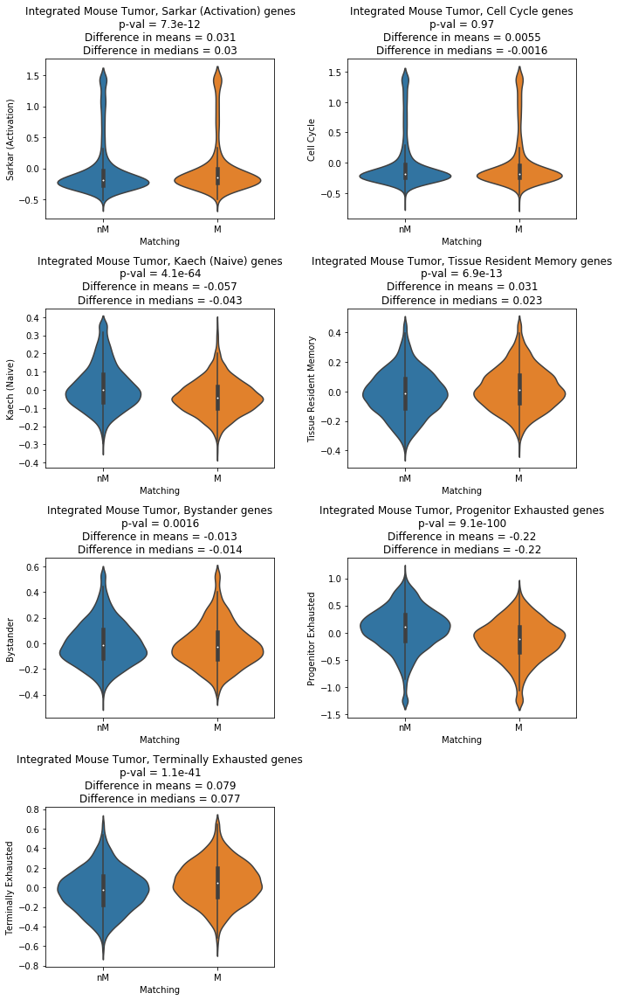

In [50]:
fig, axes = MakeViolinPlots('Integrated Mouse Tumor', MouseIntTumor, gene_lists, gene_names,
                            figsize = (10,16), Cap = True)
plt.savefig('Figures/SuppFig3B_MouseIntTumor_ViolinPlots.pdf')
plt.show()

# Count alpha and beta chains in TCR sequences

### Create a Function to Count Chains

In [51]:
def CountTCRchains(Adata):
    
    # Make a list of each TCR sequence for each cell
    TCR_list = list(Adata.obs['TCR'].copy())
    
    # First, find the maximum number of alpha and beta chains for the sample
    max_chain_a = 0
    max_chain_b = 0
    
    for TCR in TCR_list:
        if TCR == 'notcr':
            
            continue
            
        a = TCR.split("|")[0]
        b = TCR.split("|")[1] 
        
        if len(a.split("-")) >= max_chain_a:
            max_chain_a = len(a.split("-")) + 1
        
        if len(b.split("-")) >= max_chain_b:
            max_chain_b = len(b.split("-")) + 1
    
    # Create the numpy array
    count_array = np.zeros([max_chain_a,max_chain_b], int)

    # Now count how many alpha and beta chains there are for each cell
    for TCR in TCR_list:
        
        # If TCR isn't sequenced, just skip the TCR
        if TCR == 'notcr':
            alpha = 0
            beta = 0

            
        else:        
            # Define 'a' as the alpha chain and 'b' as the beta chain
            a = TCR.split("|")[0]
            b = TCR.split("|")[1]
            
            
            if a == '':
                alpha = 0
            else:
                alpha = len(a.split("-"))
            
            
            if b == '':
                beta = 0
            else:
                beta = len(b.split("-"))

        count_array[alpha,beta] += 1
        
    return(count_array)

### Run on Individual Blood Objects

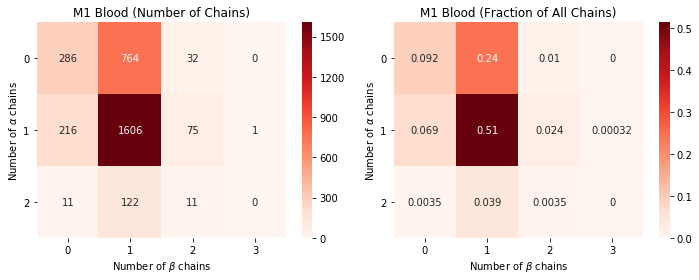

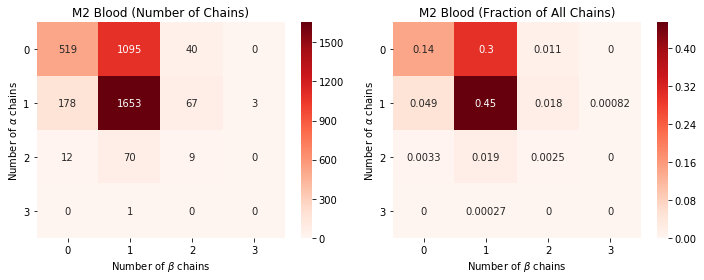

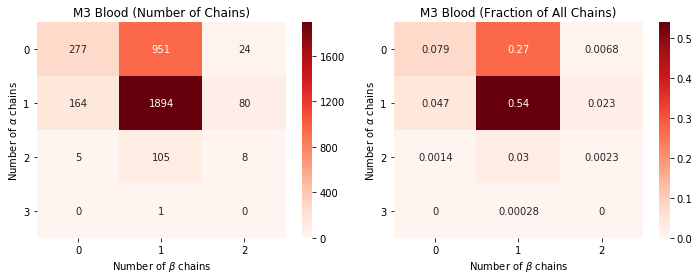

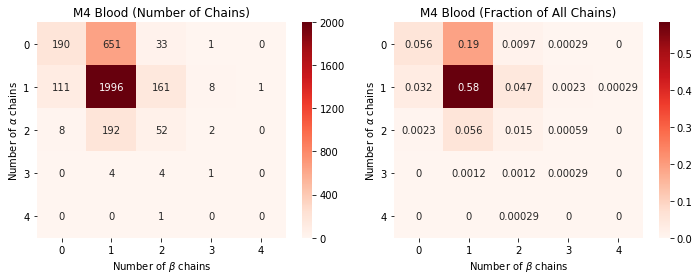

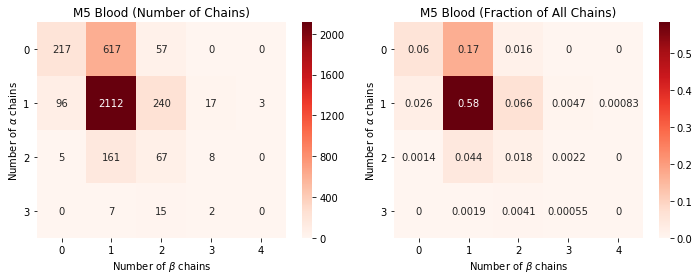

In [52]:
for i,sample in enumerate(samples):

    mtx = CountTCRchains(Blood_adatas[i])
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(sample + " Blood (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(sample + " Blood (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

### Run on Individual Tumor Objects

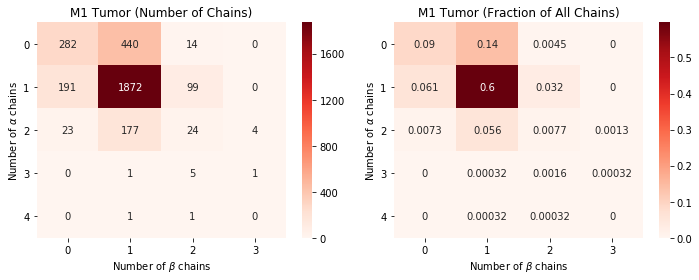

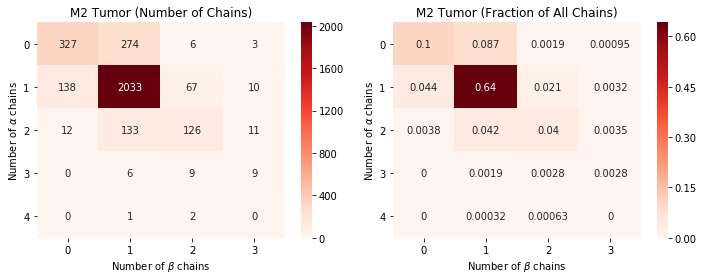

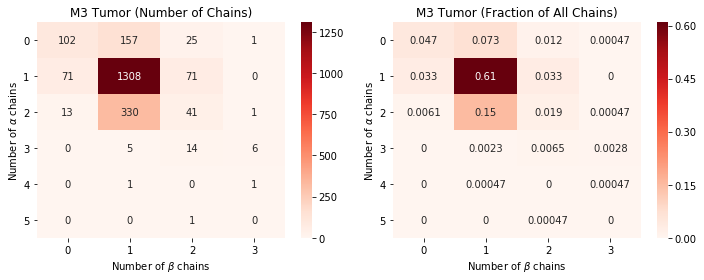

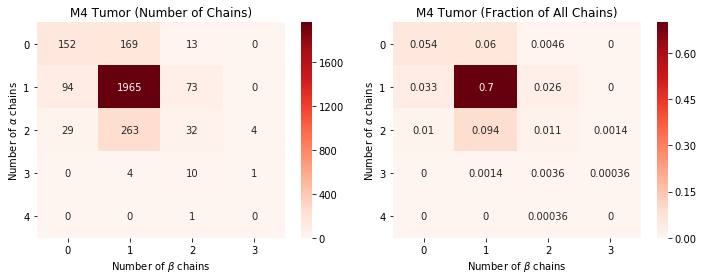

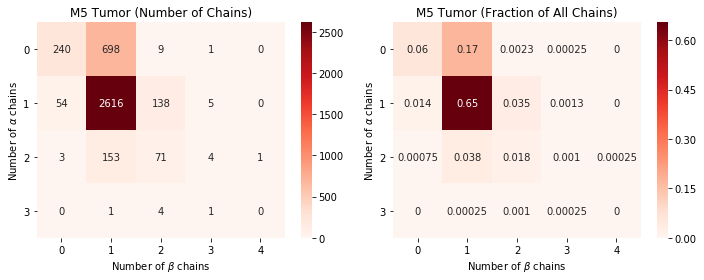

In [53]:
for i,sample in enumerate(samples):

    mtx = CountTCRchains(Tumor_adatas[i])
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(sample + " Tumor (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(sample + " Tumor (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

### Run on Integrated Objects

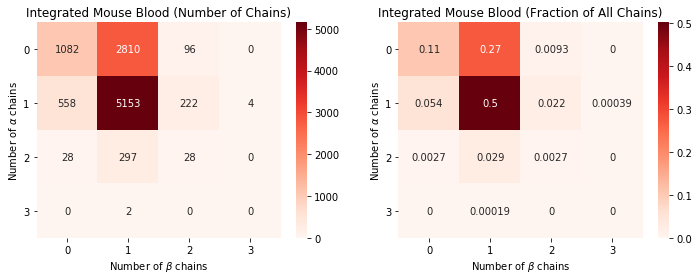

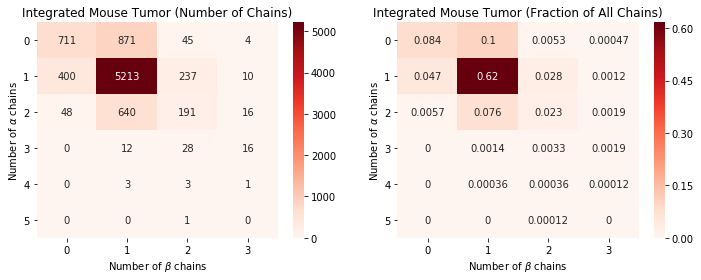

In [54]:
Integrated = [MouseIntBlood,MouseIntTumor]
IntNames = ["Integrated Mouse Blood", "Integrated Mouse Tumor"]

for i,sample in enumerate(Integrated):  
    
    mtx = CountTCRchains(sample)
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(IntNames[i] + " (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(IntNames[i] + " (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    
    if i == 0:
        extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig1G_MouseIntBlood_alpha_beta_fractions.pdf',
                    bbox_inches=extent.expanded(1.45, 1.55))
        
    if i == 1:
        extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig1G_MouseIntTumor_alpha_beta_fractions.pdf',
                    bbox_inches=extent.expanded(1.45, 1.55))
    
    
    
    
    
    plt.show()

# Count Cells in Each Cluster

### Create Function

In [55]:
def CountCells(Adata):
    
    # Get metadata
    df = Adata.obs.copy()
    df_AB = AB_Clones(Adata).obs.copy()
    
    # Define list of possible matching cell status
    Matching_list = ['matching', 'M1_matching', 'M2_matching', 'M3_matching']
    
    # Get list of clusters
    cluster_numbers = sorted(list(df['Seurat_clusters'].unique()), key = int)
    
    GEX = np.zeros(len(cluster_numbers), dtype = int)
    AB =  np.zeros(len(cluster_numbers), dtype = int)
    Matching = np.zeros(len(cluster_numbers), dtype = int)
    
    # Loop over each cluster
    for i,cluster in enumerate(cluster_numbers):
        
        # Subset data to keep only cells in that cluster
        df_clus = df[ df['Seurat_clusters'] == cluster ]              # All cells
        df_clus_AB = df_AB[ df_AB['Seurat_clusters'] == cluster ]     # AB cells
        
        # Number of cells in the cluster
        GEX[i] = len(df_clus)
        
        # Number of AB cells
        AB[i] = len(df_clus_AB)
        
        # Number of matching cells
        Matching[i] = len(df_clus_AB[ df_clus_AB['Matching'] != 'not_matching' ])
        
    # Percent matching
    PercentMatching = np.round(Matching/AB, decimals = 2)
        
    return(GEX, AB, Matching, PercentMatching)

In [56]:
def CountCells_to_df(Adatas, tissue):
    
    # Empty dataframe
    df = pd.DataFrame()
    
    # Loop over each sample
    for i,sample in enumerate(samples[:3]):

        # Get number of cells per cluster
        GEX, AB, Matching, PercentMatching = CountCells(Adatas[i])
        sample_key = sample + '_' + tissue

        # Summarize results into dataframe
        d = {sample_key + ' # of GEX cells': GEX,
             sample_key + ' # of AB cells':  AB,
             sample_key + ' # of Matching cells': Matching,
             sample_key + ' % of Matching cells': PercentMatching}

        # Merge into dataframe for all samples
        df = pd.concat([df, pd.DataFrame(d)], axis = 1)

    # Rename index
    df.index.name = 'Cluster'

    Sum = np.array(df.sum(axis=0, numeric_only = True), dtype = int)
    df.loc['Sum'] = Sum
    df = df.fillna('-')
    
    return(df)

### Count Cells for Individual Blood and Tumor Samples

In [57]:
blood_df = CountCells_to_df(Blood_adatas, 'Blood')
tumor_df = CountCells_to_df(Tumor_adatas, 'Tumor')

### Count Cells for Integrated Blood and Tumor Samples

In [58]:
GEX, AB, Matching, PercentMatching = CountCells(MouseIntBlood)
sample_key = 'IntMouseBlood'

# Summarize results into dataframe
d = {sample_key + ' # of GEX cells': GEX,
     sample_key + ' # of AB cells':  AB,
     sample_key + ' # of Matching cells': Matching,
     sample_key + ' % of Matching cells': PercentMatching}

IntBlood_df = pd.DataFrame(d)
IntBlood_df.index.name = 'Cluster'
Sum = np.array(IntBlood_df.sum(axis=0, numeric_only = True), dtype = int)
IntBlood_df.loc['Sum'] = Sum

In [59]:
GEX, AB, Matching, PercentMatching = CountCells(MouseIntTumor)
sample_key = 'IntMouseTumor'

# Summarize results into dataframe
d = {sample_key + ' # of GEX cells': GEX,
     sample_key + ' # of AB cells':  AB,
     sample_key + ' # of Matching cells': Matching,
     sample_key + ' % of Matching cells': PercentMatching}

IntTumor_df = pd.DataFrame(d)
IntTumor_df.index.name = 'Cluster'
Sum = np.array(IntTumor_df.sum(axis=0, numeric_only = True), dtype = int)
IntTumor_df.loc['Sum'] = Sum

# Make Stacked Barplots

### Create Function

In [60]:
def MakeStackedBarplots(df, sample):
    
    # Create a figure with a single subplot
    fig, ax = plt.subplots(1, figsize=(10,5))
    
    # Remove any strings
    df = df.replace('-', np.nan)
    df = df.dropna()

    # Number of AB cells across clusters
    AB = df[[col for col in df.columns if 'AB' in col]].values.flatten()
    
    # Number of Matching cells across clusters
    Matching = df[[col for col in df.columns if '# of Matching' in col]].values.flatten()
    
    # Set up the plot
    
    # Set bar width at 1
    bar_width = 0.85

    # positions of the left bar-boundaries
    bar_l = [i for i in range(len(AB))] 

    # positions of the x-axis ticks (center of the bars as bar labels)
    tick_pos = [i for i in bar_l] 
    
    bottom = [k/j * 100 for j,k in zip(AB, Matching)]
    top    = [(j-k)/j * 100 for j,k in zip(AB, Matching)]
    
    ax.bar(bar_l, bottom, label='% Matching', alpha=0.9, color='blue', width=bar_width, edgecolor='white')
    ax.bar(bar_l, top, bottom=bottom, label='% non-Matching', alpha=0.9, color='#019600', width=bar_width,
           edgecolor='white')
    
    tick_labels = [x for x in df.index]
    plt.xticks(tick_pos, tick_labels)
    ax.set_ylabel("Percent of Matching Cells")
    ax.set_xlabel("Cluster")
    ax.set_title(sample)
    plt.legend()
    plt.show()
    
    return fig, ax

### Run on Individual Samples

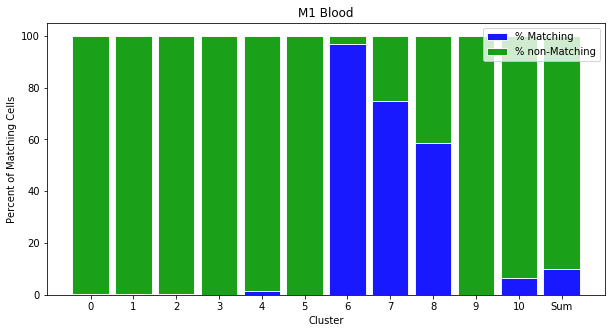

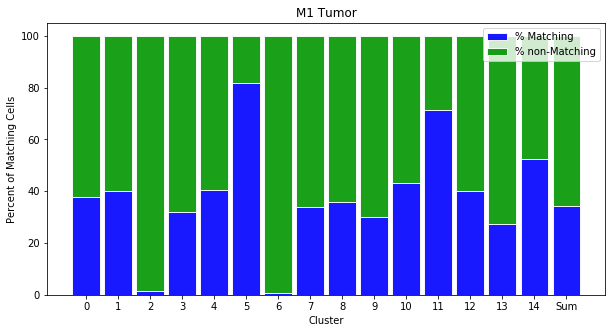

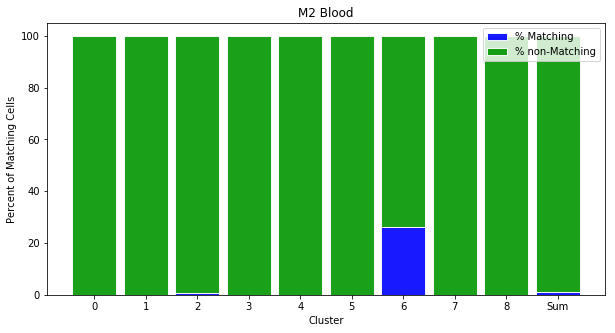

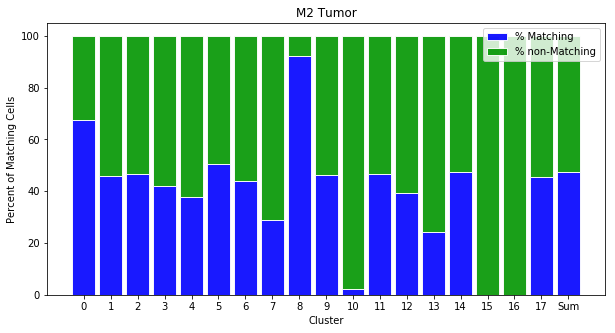

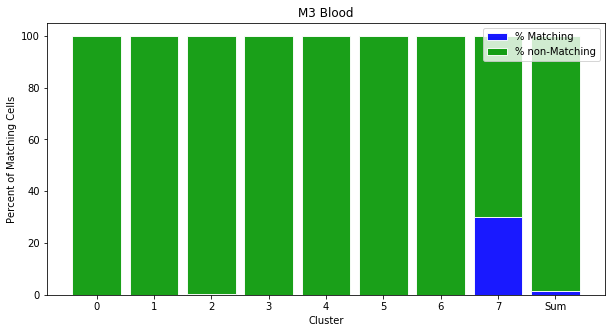

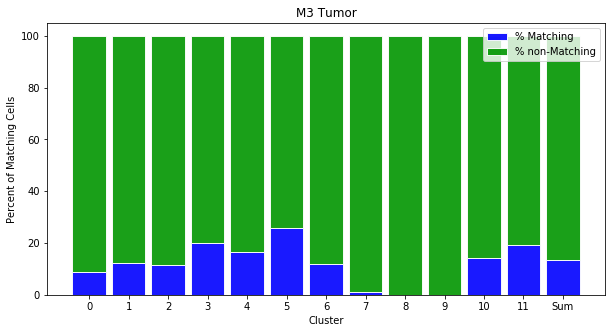

In [61]:
for i,sample in enumerate(samples[:3]):
    
    # Subset dataframe to keep only data from that blood sample
    df = blood_df[[col for col in blood_df.columns if sample in col]]
    fig, ax = MakeStackedBarplots(df, sample + ' Blood')
    
    
    # Subset dataframe to keep only data from that tumor sample
    df = tumor_df[[col for col in tumor_df.columns if sample in col]]
    fig, ax = MakeStackedBarplots(df, sample + ' Tumor')

### Run on Integrated Samples

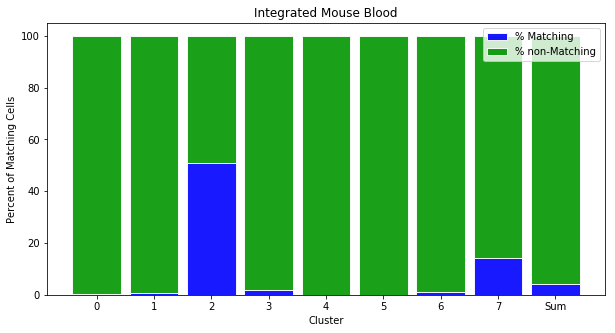

<Figure size 432x288 with 0 Axes>

In [62]:
# NOTE: In the paper, cluster 7 was removed since it had fewer than 50 cells
fig, ax = MakeStackedBarplots(IntBlood_df, 'Integrated Mouse Blood')
plt.savefig('Figures/Fig3B_MouseIntBlood_StackedBarPlotClusters.pdf')

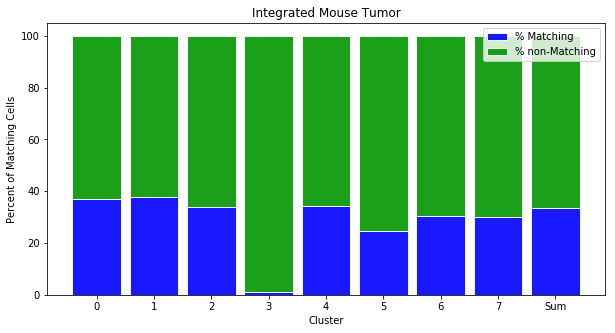

<Figure size 432x288 with 0 Axes>

In [63]:
fig, ax = MakeStackedBarplots(IntTumor_df, 'Integrated Mouse Tumor')
plt.savefig('Figures/Fig3B_MouseIntTumor_StackedBarPlotClusters.pdf')

# Make Data for Fig S1A

In [64]:
for i,sample in enumerate(samples[:3]):

    # Total number of GEX barcodes
    all_cells = len(Blood_adatas[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Blood_adatas[i]).obs.copy()
    ab_cells = len(df)
    
    # Total number (and percent) of tumor matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are tumor_matching in count matrix
    matching_ids = df[ df['Matching'] == 'matching' ].index
    df_mtx = Blood_adatas[i][matching_ids, 'Pdcd1'].X
    matching_PD1 = np.count_nonzero(df_mtx)
    
    # Percentage of PD1+ cells that are tumor matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells, ab_cells, matching, perc_matching, matching_PD1]

    print('\nFor sample {}:'.format(sample))
    print('There are {} GEX barcodes, {} AB cells, and {} tumor-matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are tumor matching, and {:.2f}% of tumor matching cells are PD1+.'.format(*data[3:]))


For sample M1:
There are 3124 GEX barcodes, 1815 AB cells, and 183 tumor-matching cells.
10.08% of AB cells are tumor matching, and 11.48% of tumor matching cells are PD1+.

For sample M2:
There are 3647 GEX barcodes, 1803 AB cells, and 22 tumor-matching cells.
1.22% of AB cells are tumor matching, and 9.09% of tumor matching cells are PD1+.

For sample M3:
There are 3509 GEX barcodes, 2088 AB cells, and 28 tumor-matching cells.
1.34% of AB cells are tumor matching, and 10.71% of tumor matching cells are PD1+.


In [65]:
for i,sample in enumerate(samples[:3]):

    # Total number of GEX barcodes
    all_cells = len(Tumor_adatas[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Tumor_adatas[i]).obs.copy()
    ab_cells = len(df)
    
    # Total number (and percent) of tumor matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are tumor_matching in count matrix
    matching_ids = df[ df['Matching'] == 'matching' ].index
    df_mtx = Tumor_adatas[i][matching_ids, 'Pdcd1'].X
    matching_PD1 = np.count_nonzero(df_mtx)
    
    # Percentage of PD1+ cells that are tumor matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells, ab_cells, matching, perc_matching, matching_PD1]

    print('\nFor sample {}:'.format(sample))
    print('There are {} GEX barcodes, {} AB cells, and {} tumor-matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are tumor matching, and {:.2f}% of tumor matching cells are PD1+.'.format(*data[3:]))


For sample M1:
There are 3135 GEX barcodes, 2185 AB cells, and 752 tumor-matching cells.
34.42% of AB cells are tumor matching, and 74.60% of tumor matching cells are PD1+.

For sample M2:
There are 3167 GEX barcodes, 2407 AB cells, and 1144 tumor-matching cells.
47.53% of AB cells are tumor matching, and 94.49% of tumor matching cells are PD1+.

For sample M3:
There are 2148 GEX barcodes, 1779 AB cells, and 239 tumor-matching cells.
13.43% of AB cells are tumor matching, and 85.77% of tumor matching cells are PD1+.


# Make Clone size Plots

### Create Functions

In [66]:
def set_logsx(axes,vector):
    if max(vector) > 1000:
        axes.xaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_xlim(right=max(vector)+1000)
    
    elif max(vector) > 100:
        axes.xaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_xlim(right=1000)
    
    elif max(vector) > 10:
        axes.xaxis.set_minor_locator(MultipleLocator(10))
        return axes.set_xlim(right=100)
    
    else:
        axes.xaxis.set_minor_locator(MultipleLocator(1))
        return axes.set_xlim(right=10)
    
def set_logsy(axes,vector):
    if max(vector) > 1000:
        axes.yaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_ylim(top=max(vector)+1000)
    
    elif max(vector) > 100:
        axes.yaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_ylim(top=1000)
    
    elif max(vector) > 10:
        axes.yaxis.set_minor_locator(MultipleLocator(10))
        return axes.set_ylim(top=100)
    
    else:
        axes.yaxis.set_minor_locator(MultipleLocator(1))
        return axes.set_ylim(top=10)

In [67]:
def ExtractCloneSize(df,TCR):
    
    CS = df[ df['TCR'].isin([TCR]) ]['Clone.size'].unique()
    return int(CS[0])

def AxTitles(sample_list):
    name = ''
    for sample in sample_list:
        name += sample + '_'
        
    return name[:-1]
        

def CountTCRs(Blood_adata, Tumor_adata, sample, save_figure=None, supplemental=None):
    
    df_blood = AB_Clones(Blood_adata).obs.copy()
    df_tumor = AB_Clones(Tumor_adata).obs.copy()

    
    # Keep all AB clones
    df_blood = df_blood[['Clone.size', 'TCR']]
    df_tumor = df_tumor[['Clone.size', 'TCR']]

    # Create emtpy lists that will be extended later
    Blood_freq = []
    Tumor_freq = []
    TCR_list = []
    sizes = []

    # List of all the TCRs in each sample
    blood_TCRs = list(df_blood['TCR'])
    tumor_TCRs = list(df_tumor['TCR'])

    # Union of all TCRS
    Union_TCRs = set(blood_TCRs) | set(tumor_TCRs)
    Union_TCRs = sorted(Union_TCRs)

    # Empty lists
    blood_freq = [0]*len(Union_TCRs)
    tumor_freq = [0]*len(Union_TCRs)

    for i,TCR in enumerate(Union_TCRs):

        if TCR in list(blood_TCRs):
            blood_freq[i] = ExtractCloneSize(df_blood, TCR)

        if TCR in list(tumor_TCRs):
            tumor_freq[i] = ExtractCloneSize(df_tumor, TCR)

    TCR_list.extend(Union_TCRs)
    Blood_freq.extend(blood_freq)
    Tumor_freq.extend(tumor_freq)

    size_dict = Counter(zip(blood_freq,tumor_freq))
    sizes.extend([size_dict[coords] for coords in tuple(zip(blood_freq,tumor_freq))])
        

    
    # Create a dataframe to plot information, and add 'sizes' and log scaled 'sizes'
    plotting = pd.DataFrame({'TCR':TCR_list,
                             'Blood_freq':Blood_freq,
                             'Tumor_freq':Tumor_freq,
                             'Sizes':sizes,
                             'logSizes':np.log10(sizes)})

    fig, axes = plt.subplots(nrows=2,ncols=2, constrained_layout=True, figsize=(10,8))

    counter = 0
    
    titles = ["No scaling", "$x$ log scaled", "$y$ log scaled", "$xy$ log scaled"]
    xlabels = ["Tumor", "Tumor (log10 scale)", "Tumor", "Tumor (log10 scale)"]
    ylabels = ["Blood", "Blood", "Blood (log10 scale)", "Blood (log10 scale)"]
    

    
    for n in [0,1]:
        for m in [0,1]:
            
            sns.scatterplot(x='Tumor_freq', y='Blood_freq', data=plotting, size='logSizes',
                            ax=axes[n,m], linewidth=0, alpha = 0.5, legend = 'full')
            axes[n,m].set_title(sample + ' ' + titles[counter])
            axes[n,m].set_xlabel(xlabels[counter])
            axes[n,m].set_ylabel(ylabels[counter])
            
            if n == 0 and m == 1:
                axes[n,m].set_xscale('symlog')
                set_logsx(axes[n,m],Tumor_freq)
                
            if n == 1 and m == 0:
                axes[n,m].set_yscale('symlog')
                set_logsy(axes[n,m],Blood_freq)
                
            if n == 1 and m == 1:
                axes[n,m].set_xscale('symlog')
                axes[n,m].set_yscale('symlog')
                set_logsx(axes[n,m],Tumor_freq)
                set_logsy(axes[n,m],Blood_freq)
            
            counter += 1
                
            # Remove the legend
            axes[n,m].legend_.remove()

            # Put the correct log values
            axes[n,m].xaxis.set_major_formatter(ScalarFormatter())
            axes[n,m].yaxis.set_major_formatter(ScalarFormatter())

            # Shrink current axis by 5% in width and 10% in height
            box = axes[n,m].get_position()
            axes[n,m].set_position([box.x0, box.y0, box.width * 0.95, box.height * 0.90])
            
            
    # Put a legend to the right of the current axis    

    # Get the labels
    handles, labels = axes[1,1].get_legend_handles_labels()

    labels = labels[2:]
    
    # Rename the title of the label
    labels[0] = 'Clone Size'

    # Reset the label
    for l,label in enumerate(labels[1:]):
        label = 10**float(label)
        labels[l+1] = round(label)
        
    handles = handles[2:]
    
    lgd = axes[1,1].legend(handles,labels, loc='lower left', bbox_to_anchor=(1, 0.5))
    
    fig.suptitle("{} Clone Sizes".format(sample))

                
    plt.show()
    
    return fig, axes


### Individual Samples

M1


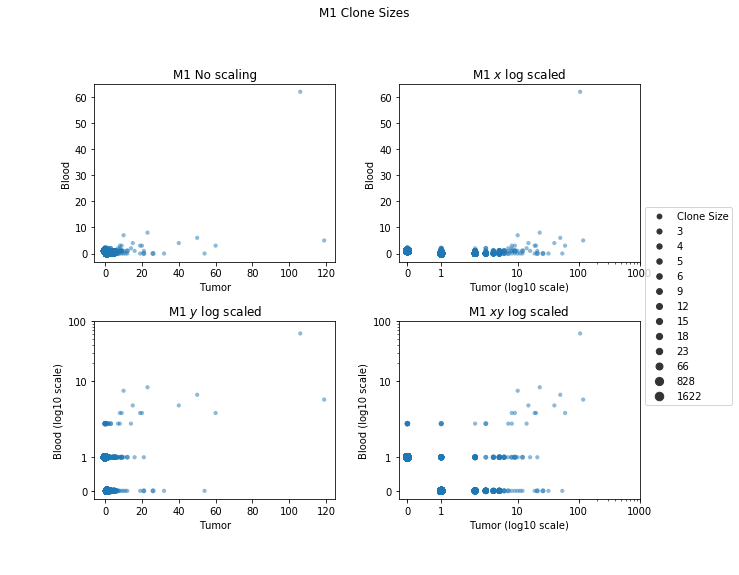

M2


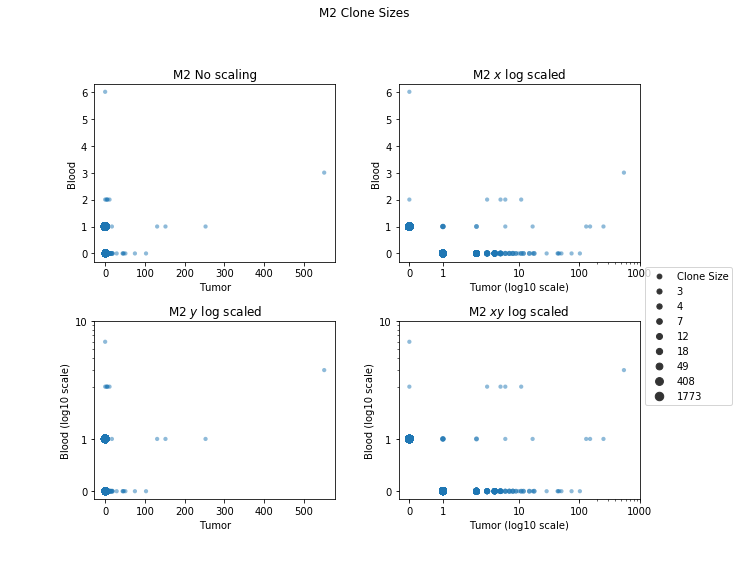

M3


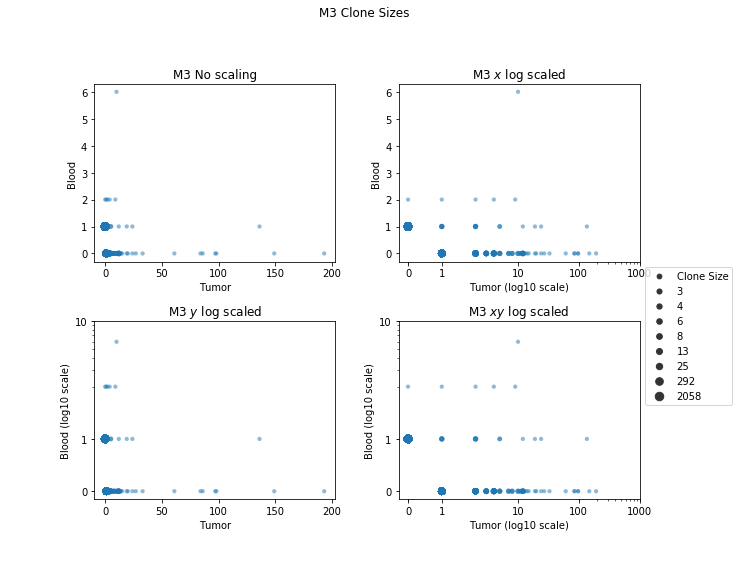

M4


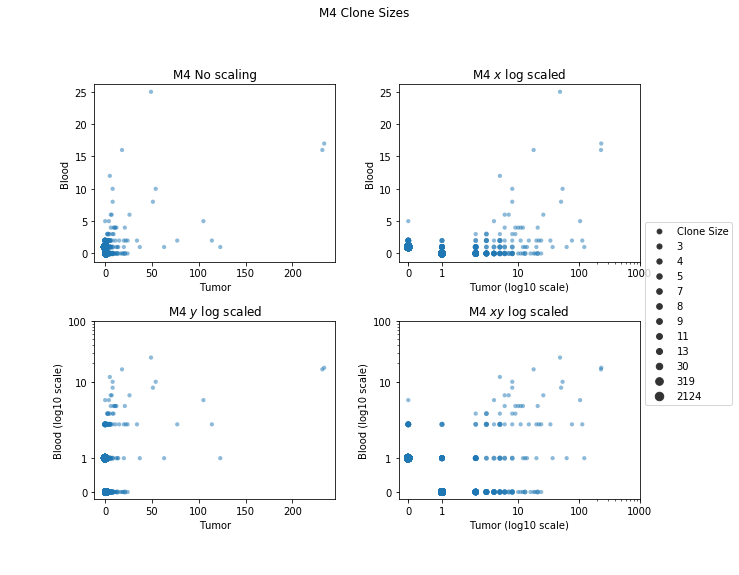

M5


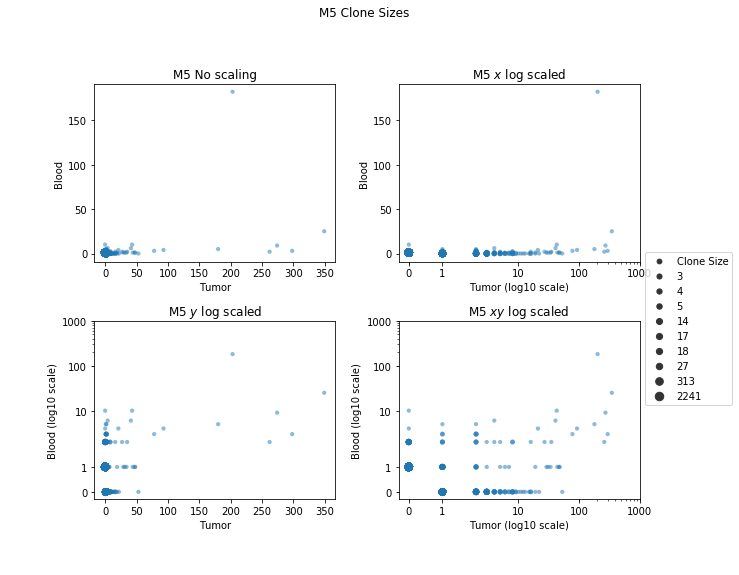

In [68]:
for i,sample in enumerate(samples):
    
    print(sample)
    
    Blood = Blood_adatas[i].copy()
    Blood.obs['Sample'].replace(sample+'_Blood', sample, inplace = True)

    Tumor = Tumor_adatas[i].copy()
    Tumor.obs['Sample'].replace(sample+'_Tumor', sample, inplace = True)
    
    
    
    
    fig, ax = CountTCRs(Blood, Tumor, sample)
    
    if sample == 'M1':
        extent = ax[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig3D_M1_CloneSizePlot.pdf', bbox_inches=extent.expanded(1.75, 2.75))
        
    if sample in ['M4','M5']:
        extent = ax[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3A_' + sample + '_CloneSizePlot.pdf', bbox_inches=extent.expanded(1.75, 2.75))
        

# Signature Analysis

### Create Functions

In [69]:
def MergeAdatas(Blood_adata, Tumor_adata):
    
    # Keep AB cells in blood and tumor
    Blood = AB_Clones(Blood_adata).copy()
    Tumor = AB_Clones(Tumor_adata).copy()
    
    # Add new column called 'Tissue'
    Blood.obs['Tissue'] = 'Blood'
    Tumor.obs['Tissue'] = 'Tumor'
    
    # Merge data, taking union of genes
    # Replace any missing genes with 0's
    Adata = Blood.concatenate(Tumor, join = 'outer')
    Adata.X = np.nan_to_num(Adata.X)
    
    # Normaliziation, logarithmize, and scale to unit variance and zero mean for each gene
    sc.pp.normalize_total(Adata, target_sum = 1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    return(Adata)

In [70]:
def CalculateTCRscores(Adata, gene_list, gene_name):
    
    # Calculate gene score    
    gene_list = IntersectionOfGenes(Adata, gene_list)
    sc.tl.score_genes(Adata, gene_list, score_name = gene_name)
    
    # Separate Adata by blood and tumor (keep only metadata)
    blood_meta = Adata[ Adata.obs['Tissue'] == 'Blood' ].obs
    tumor_meta = Adata[ Adata.obs['Tissue'] == 'Tumor' ].obs
    
    # Get list of TCRs in blood and tumor
    UniqueTCRs = list(set(blood_meta['TCR']) & set(tumor_meta['TCR']))
    UniqueTCRs = sorted(UniqueTCRs)
    
    blood_dict = {}
    tumor_dict = {}  
    
    # For each TCR, extract the set of cells with that TCR and calculate the mean gene score.
    # Add to the respective dictionary
    for TCR in UniqueTCRs:
        blood_dict[TCR] = np.mean(blood_meta.loc[ blood_meta['TCR'] == TCR ][gene_name])
        tumor_dict[TCR] = np.mean(tumor_meta.loc[ tumor_meta['TCR'] == TCR ][gene_name])
    
    # Dataframe for blood data
    blood_df = pd.DataFrame(index = blood_dict.keys(), columns = [gene_name], data = blood_dict.values())
    blood_df['Tissue'] = 'Blood'
    
    # Dataframe for tumor data
    tumor_df = pd.DataFrame(index = tumor_dict.keys(), columns = [gene_name], data = tumor_dict.values())
    tumor_df['Tissue'] = 'Tumor'
    
    return(blood_df, tumor_df)

In [71]:
def MakeViolinPlots(sample, Blood_adata, Tumor_adata, gene_lists, gene_names, figsize = (10,13)):
    
    # Merge Adata object
    Adata = MergeAdatas(Blood_adata, Tumor_adata)
    
    # Make figure and axes
    fig, axes = MakeFigAxes(ncols = 2, n_axes = len(gene_names), figsize = figsize, constrained_layout = True)
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
        # Calculate TCR scores
        blood_df, tumor_df = CalculateTCRscores(Adata, gene_list, gene_name)
        
        stat,pval = scipy.stats.wilcoxon(blood_df[gene_name], tumor_df[gene_name])
        
        # Calculate difference in means
        diff_mean = np.mean(tumor_df[gene_name]) - np.mean(blood_df[gene_name])
        
        # Calculate difference in medians
        diff_median = np.median(tumor_df[gene_name]) - np.median(blood_df[gene_name])

        # Concatenate the dataframes for easy plotting with the Seaborn package (loaded as 'sns')
        TCR_scores = pd.concat([blood_df,tumor_df])
        TCR_scores['TCR'] = TCR_scores.index
        
        # Get the axis to use
        ax = axes.flatten()[i]
        
        # Make the plot
        sns.pointplot(data = TCR_scores,  x = "Tissue", y = gene_name, hue = "TCR", ax=ax)
        ax.set_ylabel('Average Score')
        ax.legend_.remove()
        
        title1 = "{} for {}".format(gene_name,sample)
        title2 = "p-Value = %.2g" % pval
        title3 = "Difference in Means = %.2g" % diff_mean
        title4 = "Difference in Medians = %.2g" % diff_median
        title = title1 + "\n" + title2 + "\n" + title3 + "\n" + title4
        ax.set_title(title)        
        
    fig.suptitle("Sample {}, {} unique clones\n".format(sample, len(blood_df)))
    
    return(fig, axes)

### Run Analysis on Individual Samples

In [72]:
gene_lists = [progenitorexh,effector_like,terminallyexh,proliferating,kaech_naive]
gene_names = ['Progenitor Exh', 'Effector-like', 'Terminally Exh', 'Proliferating', 'Kaech (Naive)']

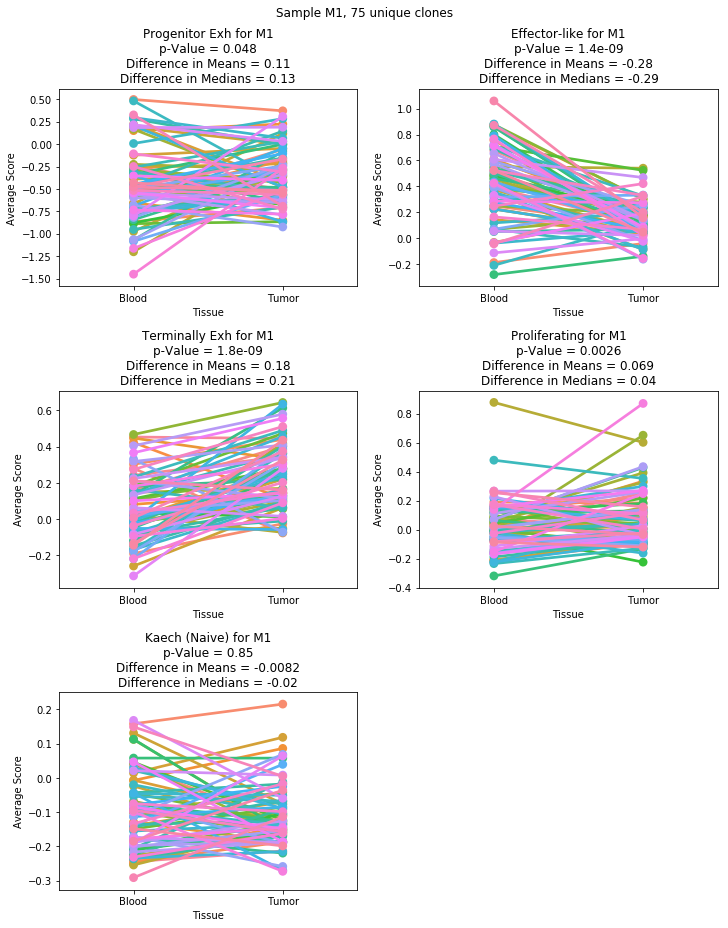

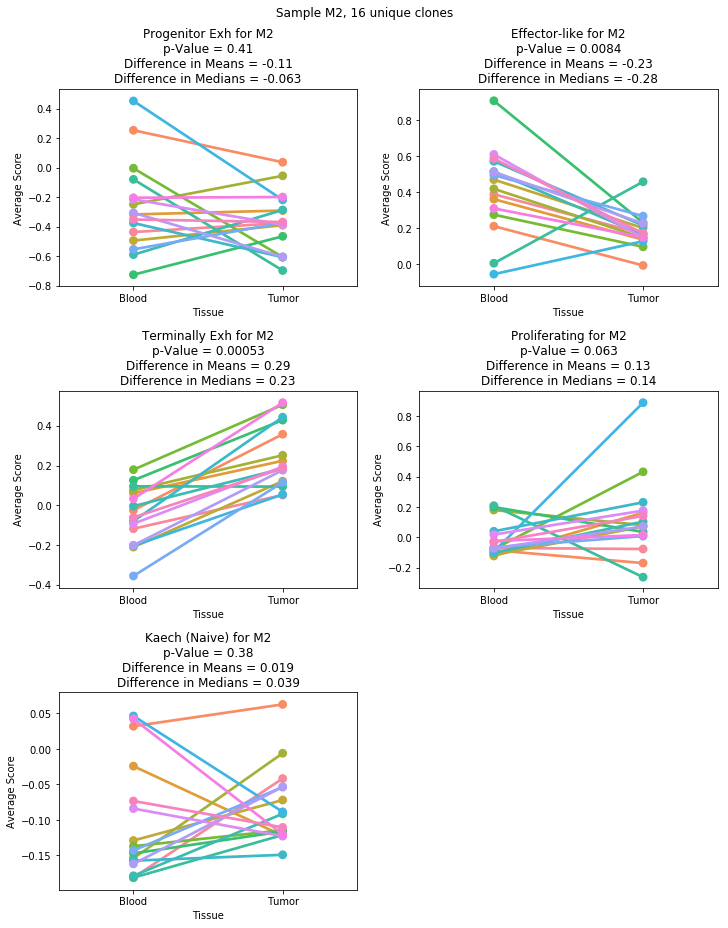

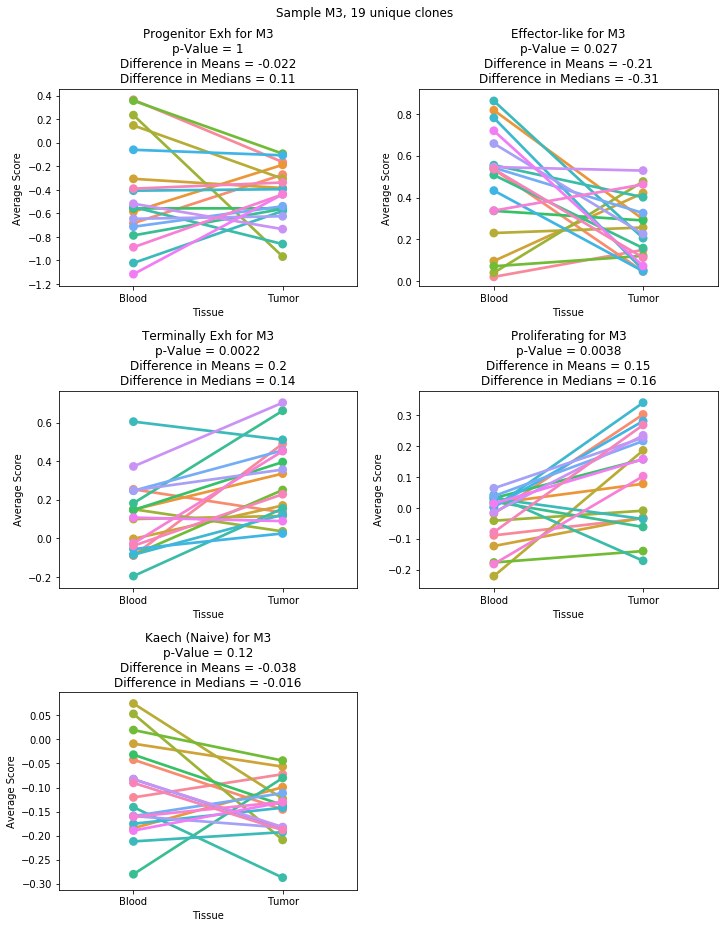

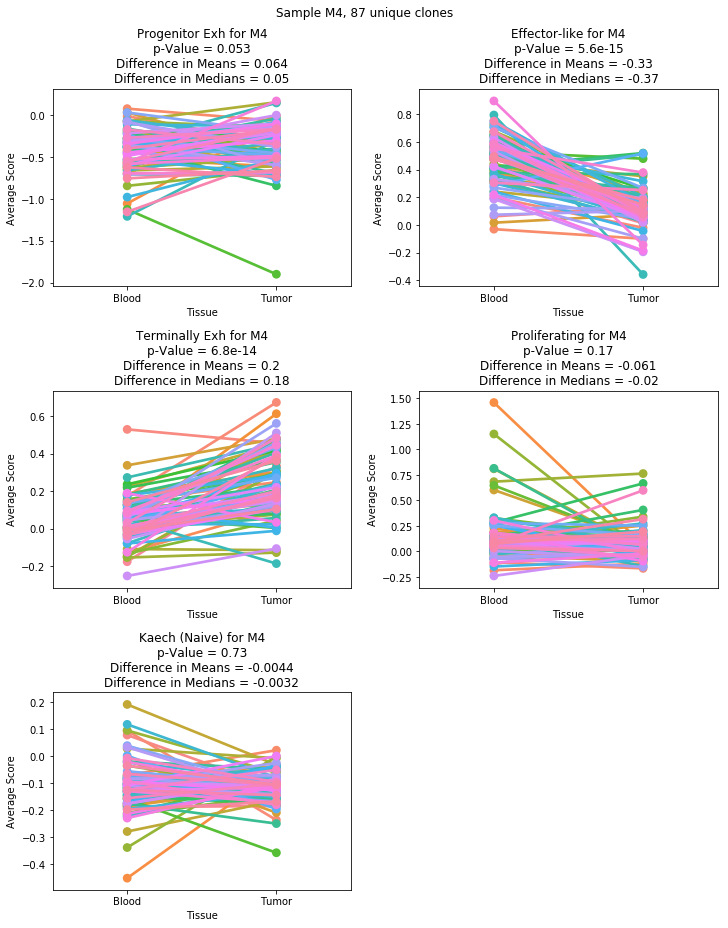

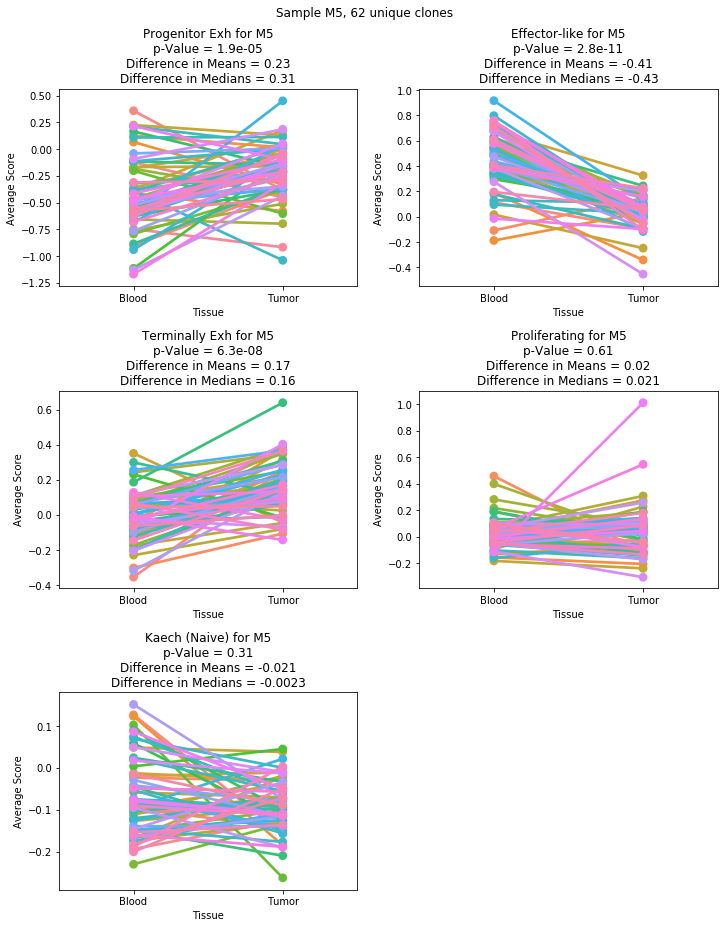

In [73]:
for i,sample in enumerate(samples):
    
    fig, axes = MakeViolinPlots(sample, Blood_adatas[i], Tumor_adatas[i], gene_lists, gene_names)
    
    if sample == 'M1':
        plt.savefig('Figures/Fig3E_M1_SignaturePointPlots.pdf')
        
    if sample == 'M2':
        plt.savefig('Figures/SuppFig2E_M2_SignaturePointPlots.pdf')
        
    if sample == 'M3':
        plt.savefig('Figures/SuppFig2E_M3_SignaturePointPlots.pdf')
    
    plt.show()

# DE Gene Analysis

### Create a Function to Find DE genes

In [74]:
def RankGenesGroupsPairwise(Adata, groupby, method = 'wilcoxon', save_name = None):
    """
    Function to find DE genes between groups.
    
    Inputs
    ------
    Adata: A single anndata object.
    groupby (string): The Adata.obs variable to make comparisons between.
    method (string): Statistical test to run (t-test, wilcoxon, etc).
    filename (string): If filename given, then save each DE gene list to an Excel file.
        
    Outputs
    -------
    Saves DE gene lists to an Excel file (optional).
    """
    
    # From the Adata object, define the unique groups in the 'groupby' column
    groups = list(Adata.obs[groupby].unique())
    
    # If the sample size is fewer than 2 cells, remove the group from the Adata object
    for group in groups:
        if len(Adata[ Adata.obs[ groupby ].isin([group]) ]) < 2:
            Adata = Adata[ ~ Adata.obs[ groupby ].isin([group]) ]

    groups = list(Adata.obs[groupby].unique())
    
    
    # Define dictionary keys, to be used later
    old_keys = ['names', 'pvals_adj', 'pvals', 'logfoldchanges', 'scores']
    new_keys = ['Gene Names', 'Adj pvals', 'Pvals', 'Log2FC', 'Scores']
    
    # Create an emtpy dictionary, DEgenes, to store the results
    DEgenes = {}
    
    # For each group in groups, make the group a reference
    for ref in groups:
        print('The reference group is {}\n'.format(ref))
    
        # Find the DE genes, put them in the Adata object
        sc.tl.rank_genes_groups(Adata, groupby = groupby, groups = groups, reference = ref, method = method,
                                n_genes = len(Adata.var_names) , use_raw=False)

        # Plot the DE genes (if not using GSEA pipeline)
        sc.pl.rank_genes_groups(Adata, n_genes = 20)
    
        # Extract the DE genes and statistics from the Adata object
        results = Adata.uns['rank_genes_groups']
        
        # s_groups (sample groups) are the names of the groups in which DE genes are upregulated
        s_groups = results['names'].dtype.names
        
        
        # For each sample in the comparison,
        for sample in s_groups:
            
            # Create an emtpy pandas dataframe
            df = pd.DataFrame(columns = new_keys)

            # Load the data from the results object to the dataframe
            for new_key,old_key in zip(new_keys,old_keys):
                df[new_key] = results[old_key][sample]
            
            # Keep genes that are significant
            df = df[ df['Adj pvals'] < 0.05 ]
            
            # Sort
            df['Rank1'] = df['Adj pvals'].rank(ascending=False)
            df['Rank2'] = df['Log2FC'].rank()
            df['Avg_Rank'] = (df['Rank1'] + df['Rank2'])/2
            df = df.sort_values(by = 'Avg_Rank', ascending=False)
            
            df = df[ df['Log2FC'] > 0 ]
            df = df.drop(columns = ['Rank1', 'Rank2', 'Avg_Rank'])
            
            # Save the dataframe into the DEgenes object
            DEgenes[sample + ' vs. ' + ref] = df
            
    # If save_name is given, save results to an Excel file
    if save_name is not None:
        
        with pd.ExcelWriter(save_name) as writer:

            # For each key,
            for key in DEgenes.keys():

                # Extract the pandas dataframe, save it to an Excel sheet
                df = DEgenes[key]
                df.to_excel(writer, sheet_name = key)
        
        
    return DEgenes

### Run on Integrated Mouse Blood - Matching vs. Non-Matching

... storing 'Matching' as categorical


The reference group is not_matching



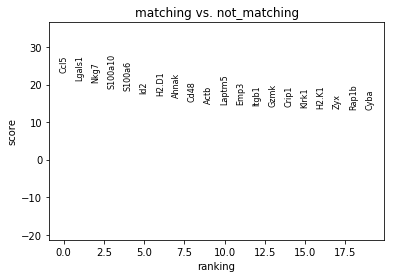

The reference group is matching



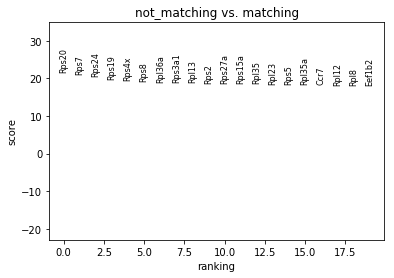

In [75]:
Adata = AB_Clones(MouseIntBlood).copy()

Adata.obs['Matching'].replace(['M1_matching', 'M2_matching', 'M3_matching'], 'matching', inplace = True)

DEgenes = RankGenesGroupsPairwise(Adata, groupby = 'Matching',
                                  save_name = 'Outputs/TableS2_DEgenes_TM_vs_nTM.xlsx')

### Run on Integrated Mouse Tumor - Matching vs. Non-Matching

... storing 'Matching' as categorical


The reference group is not_matching



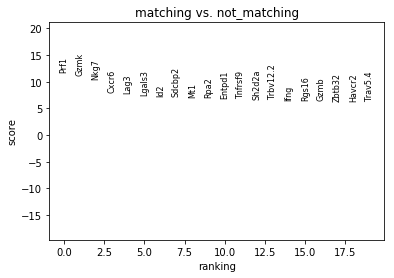

The reference group is matching



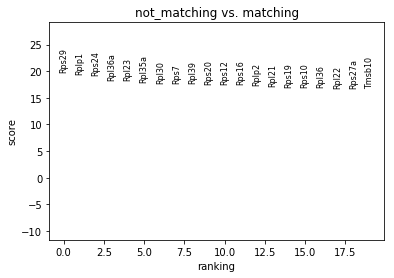

In [76]:
Adata = AB_Clones(MouseIntTumor).copy()

Adata.obs['Matching'].replace(['M1_matching', 'M2_matching', 'M3_matching'], 'matching', inplace = True)

DEgenes = RankGenesGroupsPairwise(Adata, groupby = 'Matching')

# Pseudo-Bulk Analysis

### Create Function to Get Pseudo-Bulk Data

In [77]:
def PseudoBulkAnalysis():

    # Initialize tissue and matching setting
    Adatas = [MouseIntTumor, MouseIntBlood]
    m = ['M1_matching', 'M2_matching', 'M3_matching']


    # Make list of union of genes
    all_genes = list(set(Adatas[0].var_names) | set(Adatas[1].var_names))
    
    Matrices = [0,0]

    # Loop over Adata objects, one for tumor and one for blood
    for i,Adata in enumerate(Adatas):

        # Copy the adata object
        Adata = Adatas[i].copy()

        # Keep only the matching cells
        Adata = Adata[ Adata.obs['Matching'].isin(m) ]
        
        # Label all matching cells as 'matching
        Adata.obs['Matching'].replace(m, 'matching', inplace = True)

        # Get all the TCRs
        TCRs = list(Adata.obs['TCR'].unique())
        T = len(TCRs)

        # Initialize matrix, one row for each TCR/clone, and one column for each gene
        matrix = np.zeros([len(TCRs), len(all_genes)], int)

        # For each TCR,
        for j,TCR in enumerate(sorted(TCRs)):
            if j == int(T/2):
                print('Halfway through TCRs')
            
            # Subset Adata to keep all cells in the same clone
            data = Adata[ Adata.obs['TCR'].isin([TCR]) ]

            # For each gene,
            for k,gene in enumerate(all_genes):

                # If the gene is in the Adata object,
                if gene in list(data.var_names):
                    #print(gene)

                    # Get the average count
                    matrix[j,k] = data[:, gene].X.sum()

                else:
                    matrix[j,k] = 0

        Matrices[i] = matrix

    return Matrices

### Get Output, Prepare for EdgeR

In [78]:
# Get the matrices
# This analysis takes quite some time
Matrices = PseudoBulkAnalysis()

In [80]:
# Set up the matrices so that we can properly use it in EdgeR to find DE Genes
# First get a list of all the matching TCRs (remove non-matching TCRs)
Adata = AB_Clones(MouseIntBlood).copy()
Adata = Adata[ Adata.obs['Matching'] != 'not_matching' ]
TCRs = sorted(list(Adata.obs['TCR'].unique()))

# Make list of genes
all_genes = list(set(MouseIntTumor.var_names) | set(MouseIntBlood.var_names))

In [81]:
# Make a list of tumor and blood clones to label each clone
all_clones = ['Clone_{}_Tumor'.format(i) for i in range(len(TCRs))]
all_clones.extend(['Clone_{}_Blood'.format(i) for i in range(len(TCRs))])

In [82]:
# Put the PseudoBulk data into a dataframe and save to disk, then load into EdgeR
PseudoBulk = pd.DataFrame(index = all_clones, columns = all_genes, data = np.concatenate(Matrices))
PseudoBulk.to_csv('Outputs/MousePseudoBulk_forEdgeR.csv')

### Read outputs from EdgeR

In [83]:
# Get results from R
DEgenes = pd.read_csv('MousePseudoBulk_DEgenes_unsorted.csv', index_col = 0)

# Sort DE genes
DEgenes['Rank1'] = DEgenes['FDR'].rank(ascending=False)
DEgenes['Rank2'] = DEgenes['logFC'].rank()
DEgenes['Avg_Rank'] = (DEgenes['Rank1'] + DEgenes['Rank2'])/2
DEgenes = DEgenes.sort_values(by = 'Avg_Rank', ascending=False)
DEgenes = DEgenes.drop(columns = ['Rank1', 'Rank2', 'Avg_Rank'])

In [84]:
# Genes upregulated in tumor have positive logfoldchange
# Genes upregulated in blood have negative logfoldchange
DEG_tumor = DEgenes[ DEgenes['logFC'] > 0 ]
DEG_blood = DEgenes[ DEgenes['logFC'] < 0 ]

# Save as Python dictionary
DEgenes = {}
DEgenes['Up_in_tumor'] = DEG_tumor
DEgenes['Up_in_blood'] = DEG_blood

In [85]:
# Save as Excel file
with pd.ExcelWriter('Outputs/MousePseudoBulk_DEgenes_sorted.xlsx') as writer:

    # For each key,
    for key in DEgenes.keys():

        # Extract the pandas dataframe, save it to an Excel sheet
        df = DEgenes[key]
        df.to_excel(writer, sheet_name = key)

# Dotplots

### Create Function to Make Dotplots

In [86]:
def DotPlots(gene_lists, gene_names, save_name):
    
    # Create empty matrix
    mtx = np.zeros([len(gene_lists), 12], dtype = 'float')
    
    # Keep only AB cells from blood and tumor
    Blood = AB_Clones(MouseIntBlood).copy()
    Tumor = AB_Clones(MouseIntTumor).copy()
    
    
    # Join the adata objects
    Adata = anndata.AnnData.concatenate(Blood, Tumor, join = 'outer')
    
    # Fill NaN with 0s
    Adata.X[np.isnan(Adata.X)] = 0
    
    # Combine all matching labels into a single label
    Adata.obs['Matching'].replace(['M1_matching', 'M2_matching', 'M3_matching'], 'matching', inplace = True)
    
    # Add column to metadata, combining 'Sample' and 'Matching'
    Adata.obs['Sample_Matching'] = Adata.obs['Sample'].astype('str') + '_' + Adata.obs['Matching'].astype('str')
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata, base=2)
    sc.pp.scale(Adata)
    
    # Initialize empty variables, used only for plotting
    x_list = []
    y_list = []
    Avg_list = []
    sample_list = []
    gene_score_list = []
    
    # Define new samples
    samples = ['M1_Blood_matching', 'M2_Blood_matching', 'M3_Blood_matching',
               'M1_Blood_not_matching', 'M2_Blood_not_matching', 'M3_Blood_not_matching',
               'M1_Tumor_matching', 'M2_Tumor_matching', 'M3_Tumor_matching',
               'M1_Tumor_not_matching', 'M2_Tumor_not_matching', 'M3_Tumor_not_matching']
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
        
        genes_to_plot = IntersectionOfGenes(Adata, gene_list)
        sc.tl.score_genes(Adata, gene_list = genes_to_plot, score_name = gene_name)
        
        # Separate score by sample type
        for j,sample in enumerate(samples):
            
            # Keep all cells for that particular sample
            sample_scores = Adata[ Adata.obs['Sample_Matching'] == sample ].obs
            
            # Take the average gene score, add to mtx
            mtx[i,j] = np.mean(sample_scores[gene_name])
        
        # Update variables for plotting
        x_list.extend([i]*len(samples))
        y_list.extend([i for i in range(len(samples))])

        gene_score_list.extend([gene_names[i]]*len(samples))
        Avg_list.extend(mtx[i, :])
        sample_list.extend(samples)
        
    # Create final matrix to plot
    Mtx = pd.DataFrame(columns = ['x', 'y', 'Avg', 'Sample', 'Gene List'])
    Mtx['x'] = x_list
    Mtx['y'] = y_list
    Mtx['Avg'] = Avg_list
    Mtx['Sample'] = sample_list
    Mtx['Gene List'] = gene_score_list

    plt.figure(figsize=(10,8))

    plt.scatter(Mtx['x'], Mtx['y'], c = Mtx['Avg'], s=200, cmap=plt.cm.get_cmap('RdBu_r'), edgecolor = None)
    plt.ylabel('Sample')
    plt.xlabel('Gene Signature')
    plt.yticks([i for i in range(len(samples))], samples)
    plt.xticks([i for i in range(len(gene_names))], gene_names)
    plt.colorbar()
    plt.title('Average Gene Score per Sample (Integrated Mouse)')
    plt.tight_layout()
    plt.savefig(save_name)
    plt.show()
    
    return None

### Create Dotplot

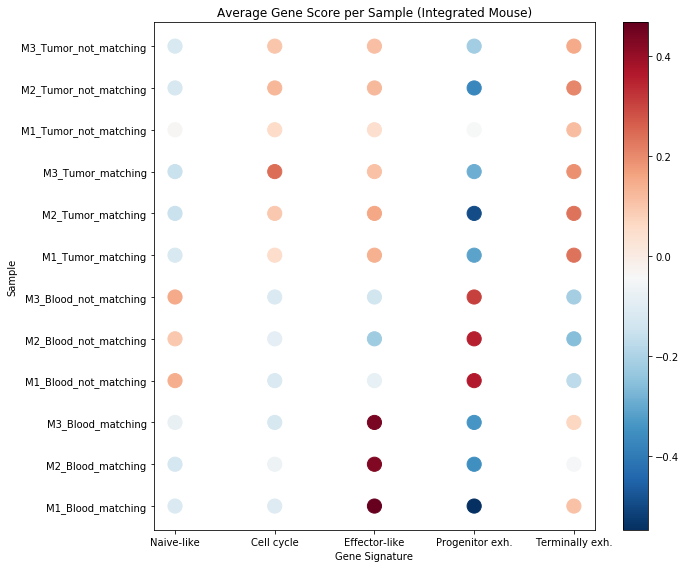

In [87]:
gene_lists = [kaech_naive, cellcycle, effector_like, progenitorexh, terminallyexh]
gene_names = ['Naive-like', 'Cell cycle', 'Effector-like', 'Progenitor exh.', 'Terminally exh.']

DotPlots(gene_lists, gene_names, save_name = 'Figures/SuppFig3C_DotplotIntegratedMouse_log2.pdf')